# Periodic Light Curves
|Name|RA |DEC |Freq(Hz) |Strain|
|:---:|:---:|:---:|:-------:|:----:|
|SDSS_J164452.71+430752.2 | 16 44 52.7 | +43 07 52.9 | 1.16E-08 | 4.88E-16|
|SDSS_J081617.73+293639.6 | 08 16 17.8 | +29 36 40.7 | 1.99E-08 | 4.37E-16|
|HS_1630+2355 |16 33 02.7 |+23 49 28.8 | 1.13E-08 | 3.95E-16|
|SDSS_J141244.09+421257.6 |12 14 44.7 | +27 14 16.7 | 5.34E-08 |5.89E-16|

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker
import matplotlib as mpl
import matplotlib.cm as cm
import scipy.interpolate as si
import scipy.stats as sps
import scipy.linalg as sl
%matplotlib inline

In [3]:
import glob, pickle, json, copy

In [4]:
import sys
sys.path.insert(0,'/Users/hazboun/software_development/hasasia/')
import hasasia.sensitivity as hsen
import hasasia.sim as hsim
import hasasia.utils as utils
import hasasia.skymap as hsky
from la_forge.utils import epoch_ave_resid

No PINT? Meh...


In [5]:
#healpy imports
import healpy as hp
import astropy.units as u
import astropy.constants as c
from astropy.coordinates import SkyCoord


In [6]:
import plot

In [7]:
! ls /Users/hazboun/anaconda3/envs/skymaps/share/proj/

CH                   epsg                 proj.db
GL27                 nad.lst              proj.ini
ITRF2000             nad27                projjson.schema.json
ITRF2008             nad83                world
ITRF2014             other.extra


In [8]:
%config InlineBackend.figure_format = 'retina'

In [9]:
def sky_ave_detect(sm,tspan,snr=8):
    return snr*np.sqrt(np.mean(sm.S_eff,axis=1)/tspan)

In [10]:
def sky_detect(sm,tspan,snr=8):
    return snr*np.sqrt(sm.S_eff/tspan)

In [11]:
def tspan_filter(psrs,tspan_min=3):
    return [p for p in psrs if hsen.get_Tspan([p])>=tspan_min]

In [12]:
fyr = 1/(365.25*24*3600)
freqs = np.logspace(np.log10(3e-10),np.log10(2e-7),300)
freqs = np.sort(np.append(freqs,[1.13e-8,1.16e-08,1.99e-08,5.34e-08])) #Append the freqs of the 4 candidates

### Make the NANOGrav Sensitivity Curve

In [13]:
with open('ng11yr_sky_sensitivity_wn.has','rb') as fin:
    SM_ng11 = pickle.load(fin)

In [14]:
tspan_ng11 = SM_ng11.Tspan

In [15]:
SkySNR_ng11 = SM_ng11.SNR(3.95e-16)

In [16]:
fidx = list(SM_ng11.freqs).index(1.13e-8)
fidx

167

In [17]:
cand1 = SkyCoord(ra='16h44m52.7s',dec='+43d07m52.9s')
cand2 = SkyCoord(ra='11h48m57.4s',dec='+16d00m22.7s')
cand3 = SkyCoord(ra='16h33m02.7s',dec='+23d49m28.8s')

In [18]:
NSIDE = 8
NPIX = hp.nside2npix(NSIDE)
IPIX = np.arange(NPIX)
theta_gw, phi_gw = hp.pix2ang(nside=NSIDE,ipix=IPIX)

In [19]:
sky_idx = hp.ang2pix(NSIDE,np.pi/2-cand3.dec.to('rad').value,cand3.ra.to('rad').value)

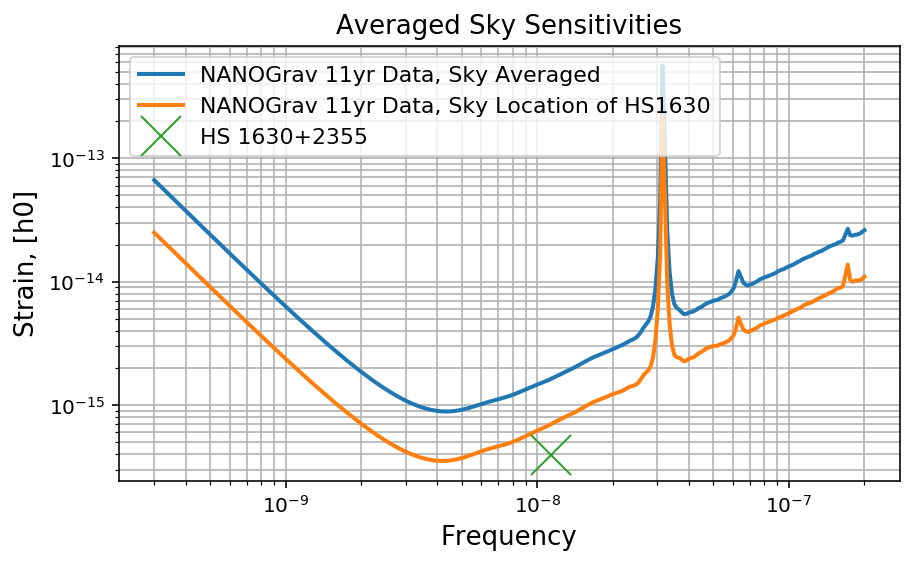

In [20]:
plt.figure(figsize=[7,4])

plt.loglog(SM_ng11.freqs,sky_ave_detect(SM_ng11,tspan_ng11,1/2),
           label='NANOGrav 11yr Data, Sky Averaged',lw=2)
plt.loglog(SM_ng11.freqs,1/2*np.sqrt(SM_ng11.S_eff[:,sky_idx]/tspan_ng11),
           label='NANOGrav 11yr Data, Sky Location of HS1630',lw=2)
plt.plot(1.13e-08, 3.95e-16,'x',markersize=20,color='C2',label='HS 1630+2355')
plt.legend(loc='upper left',fontsize=11)
plt.xlabel('Frequency',fontsize=13)
plt.ylabel('Strain, [h0]',fontsize=13)
plt.title('Averaged Sky Sensitivities',fontsize=13)
plt.grid(which='both')
plt.show()

In [21]:
# sky_ave_detect(SM_ng11,tspan_ng11,1)[fidx]/(np.sqrt(SM_ng11.S_eff[fidx,sky_idx]/tspan_ng11))

In [22]:
3*4e-16/2e-15

0.6

In [23]:
2*3.95e-16/(np.sqrt(SM_ng11.S_eff[fidx,sky_idx]/tspan_ng11))

0.5661444890070874

In [24]:
np.sqrt(SM_ng11.S_eff[fidx,sky_idx]/tspan_ng11)/2

6.977017487050999e-16

In [25]:
SM_ng11.SNR(2*3.95e-16)[fidx,sky_idx]

0.5661444890070874

## IPTA 2025
Here we start with DR2 (Perera, et al. 2019) and add 4 pulsars per year with with RMS residual values pulled from a Gaussian distribution centered at 300 nanoseconds with a 100 ns standard deviation. The sky positions are pulled from a 2d distribution made from the current sky positions. 
* Residual RMS: `Normal(300ns,100ns)`
* Add 4 pulsars per year starting in 2015
* Sky position uses a `scipy.stats` rvs using current sky positions.   

In [26]:
ipta_dr2_noise=np.genfromtxt('./simple_IPTA.txt', delimiter='\t', skip_header=1,
                                   dtype='U20, f4, f4, f4, f4',
                                   names=['psr','theta', 'phi','wn','tspan'])

In [27]:
with open('ipta_dr2_has_psrs.pkl','rb') as fin:
    psrs_sim_dr2 = pickle.load(fin)

In [28]:
specs_dr2 = []
for p in tspan_filter(psrs_sim_dr2):
    sp = hsen.Spectrum(p, freqs=freqs)
    _ = sp.NcalInv
    specs_dr2.append(sp)
#     print('\rPSR {0} complete'.format(p.name),end='',flush=True)

In [29]:
SM_dr2 = hsky.SkySensitivity(specs_dr2,theta_gw, phi_gw)
tspan_dr2 = SM_dr2.Tspan

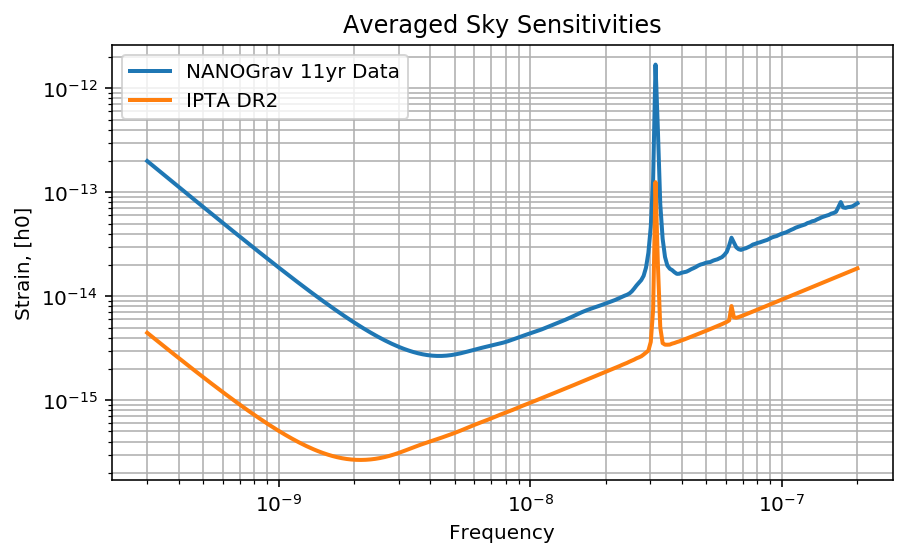

In [30]:
plt.figure(figsize=[7,4])

plt.loglog(SM_ng11.freqs,sky_ave_detect(SM_ng11,tspan_ng11,3/2),
           label='NANOGrav 11yr Data',lw=2)
plt.loglog(SM_dr2.freqs,sky_ave_detect(SM_dr2,tspan_dr2,3/2),
           label='IPTA DR2',lw=2)
plt.legend(loc='upper left')
plt.xlabel('Frequency')
plt.ylabel('Strain, [h0]')
plt.title('Averaged Sky Sensitivities')
plt.grid(which='both')
plt.show()

In [31]:
with open('ipta_plus_has_psrs.pkl','rb') as fin:
    psrs_ipta_plus = pickle.load(fin)

In [32]:
specs_ipta_plus = []
for p in tspan_filter(psrs_ipta_plus):
    sp = hsen.Spectrum(p, freqs=freqs)
    _ = sp.NcalInv
    specs_ipta_plus.append(sp)

In [33]:
SM_ipta_plus = hsky.SkySensitivity(specs_ipta_plus,theta_gw, phi_gw)
tspan_ipta_plus = hsen.get_Tspan(psrs_ipta_plus)

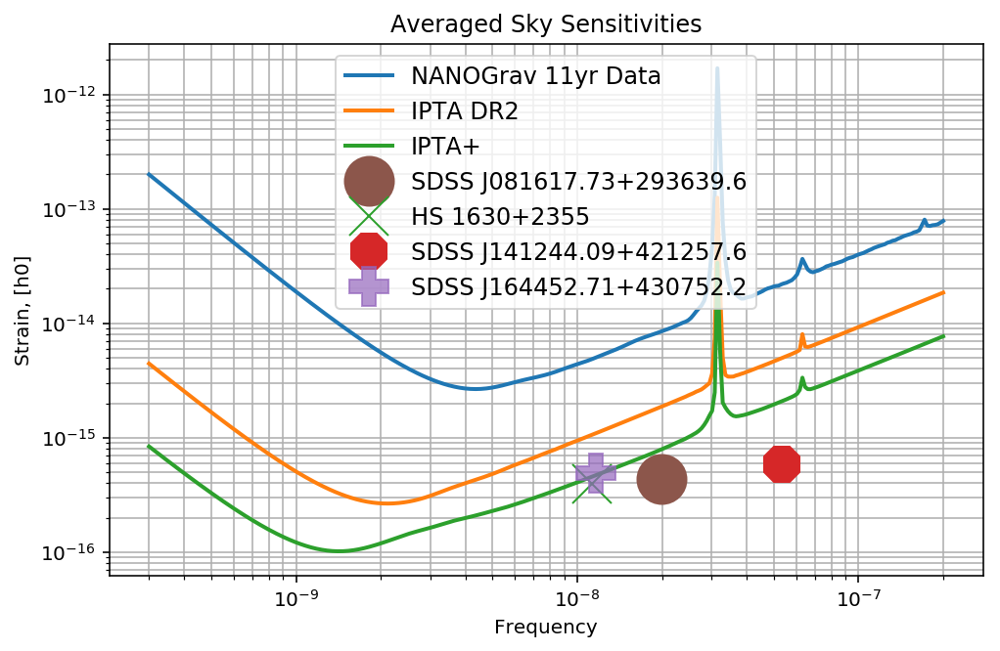

In [34]:
snr=3
plt.figure(figsize=[8,5])

plt.loglog(SM_ng11.freqs,sky_ave_detect(SM_ng11,tspan_ng11,snr)/2,
           label='NANOGrav 11yr Data',lw=2)
plt.loglog(SM_dr2.freqs,sky_ave_detect(SM_dr2,tspan_dr2,snr)/2,
           label='IPTA DR2',lw=2)
plt.loglog(SM_ipta_plus.freqs,sky_ave_detect(SM_ipta_plus,tspan_ipta_plus,snr)/2,
           label='IPTA+',lw=2)
plt.plot(1.99e-08, 4.37e-16,'.',markersize=50,color='C5',label='SDSS J081617.73+293639.6')
plt.plot(1.13e-08, 3.95e-16,'x',markersize=20,color='C2',label='HS 1630+2355')
plt.plot(5.34e-08, 5.89e-16,'8',markersize=20,color='C3',label='SDSS J141244.09+421257.6')
plt.plot(1.16e-08, 4.88e-16,'P',markersize=20,linewidth=3,alpha=0.7,color='C4',label='SDSS J164452.71+430752.2')
plt.legend(loc='upper center',fontsize=12)
plt.xlabel('Frequency')
plt.ylabel('Strain, [h0]')
plt.title('Averaged Sky Sensitivities')
plt.grid(which='both')
plt.show()

In [35]:
np.savetxt('ng11yr_sky_ave_detect_snr3.txt',
           np.array((SM_ng11.freqs,
                     sky_ave_detect(SM_ng11,tspan_ng11,3/2))).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')
np.savetxt('ipta_plus_sky_ave_detect_snr3.txt',
           np.array((SM_ipta_plus.freqs,
                     sky_ave_detect(SM_ipta_plus,tspan_ipta_plus,3/2))).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')

In [36]:
f0=1.13e-8
hcw = hsky.h_circ(2.174e8, 120,f0,tspan_ipta_plus,SM_ipta_plus.freqs).to('').value
h0 = hsky.h0_circ(2.174e8, 120, 1.13e-8).to('').value
SkySNR_ipta_plus = SM_ipta_plus.SNR(h0)

In [37]:
j1640 = SkyCoord(ra='16h40m0.0s',dec='+22d24m0s')

In [38]:
theta = cand3.separation(j1640).rad
theta

0.03737963364946375

In [39]:
1/(1-np.cos(theta))

1431.5630578479686

In [40]:
SkySNR_ipta_plus[fidx,sky_idx]

1.5237963821148912

In [41]:
snr_cand3=SkySNR_ipta_plus[sky_idx]

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


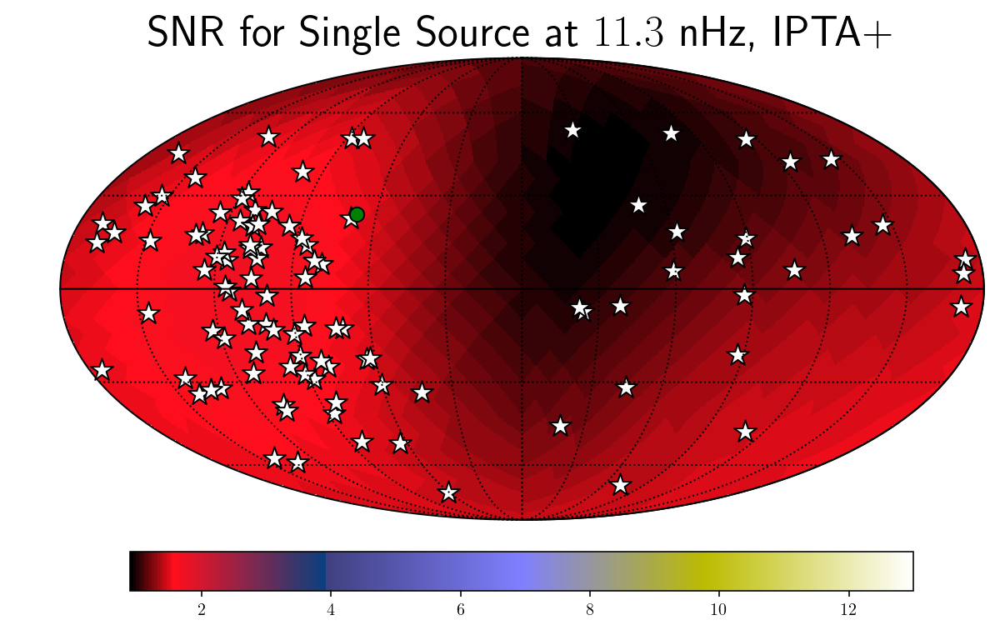

In [42]:
plt.rc('text', usetex=True)
hp.mollview(SkySNR_ipta_plus[fidx,:],rot=(180,0,0),
            cmap='gist_stern',cbar=None,title='',min=0.9,max=13.0)
hp.visufunc.projscatter(SM_ipta_plus.thetas,SM_ipta_plus.phis,marker='*',
                        color='white',edgecolors='k',s=200)
hp.visufunc.projscatter(np.pi/2-cand3.dec.to('rad').value,
                        cand3.ra.to('rad').value,marker='.',
                        color='green',edgecolors='black',s=300)

hp.graticule()
fig = plt.gcf()
ax = plt.gca()
image = ax.get_images()[0]
cmap = fig.colorbar(image, ax=ax, orientation='horizontal',shrink=0.8,pad=0.05)

plt.rcParams.update({'font.size':22,'text.usetex':True})
ax.set_title("SNR for Single Source at $11.3$ nHz, IPTA+")
plt.show()

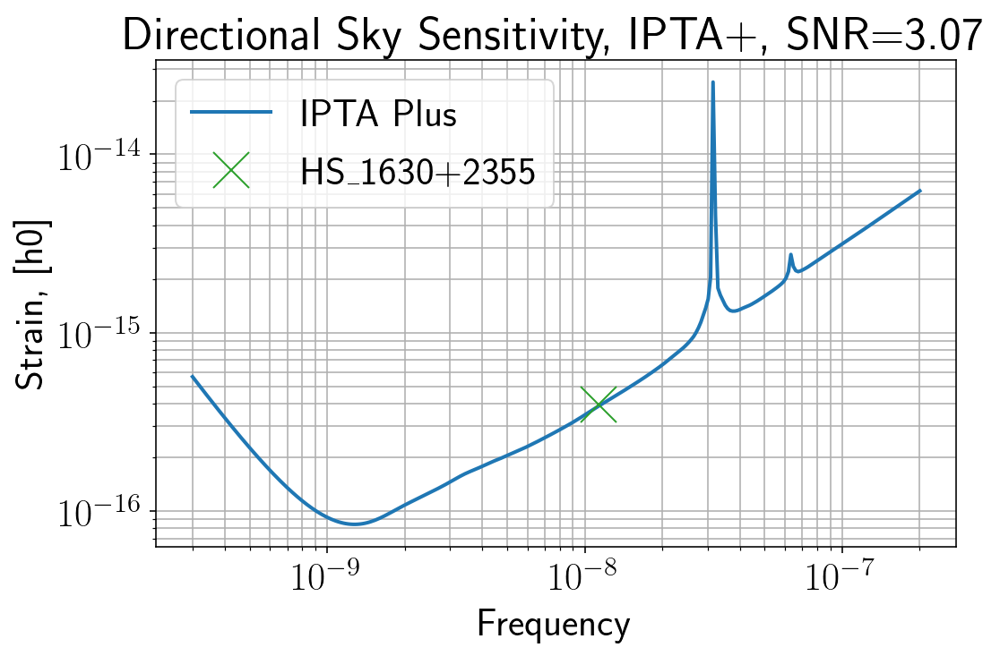

In [43]:
snr=3
plt.figure(figsize=[8,5])
plt.loglog(SM_ipta_plus.freqs,snr*np.sqrt(SM_ipta_plus.S_eff[:,sky_idx]/tspan_ipta_plus)/2,
           label='IPTA Plus',lw=2)
plt.plot(1.13e-08,3.95e-16,'x',markersize=20,color='C2',label='HS\_1630+2355')
plt.legend(loc='upper left')
plt.xlabel('Frequency')
plt.ylabel('Strain, [h0]')
plt.title('Directional Sky Sensitivity, IPTA+, SNR={0:1.2f}'.format(SM_ipta_plus.SNR(2*3.95e-16)[fidx,sky_idx]))
plt.grid(which='both')
plt.show()

In [44]:
np.savetxt('ng11yr_best_sky_detect_snr3.txt',
           np.array((SM_ng11.freqs, 3/2*np.sqrt(SM_ng11.S_eff[:,sky_idx]/tspan_ng11))).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')
np.savetxt('ipta_plus_best_sky_detect_snr3.txt',
           np.array((SM_ipta_plus.freqs,3/2*np.sqrt(SM_ipta_plus.S_eff[:,sky_idx]/tspan_ipta_plus))).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')

## SKA1 PTA

In [44]:
with open('ska1_opt_jitter_has_psrs.pkl','rb') as fin:
    ska1_opt = pickle.load(fin)
with open('ska1_cons_has_psrs.pkl','rb') as fin:
    ska1_cons = pickle.load(fin)

In [45]:
with open('ska1_opt_jitter_has_psrswGWB_ng11yr.pkl','rb') as fin:
    ska1_opt_wGWB = pickle.load(fin)

In [63]:
with open('ska2_opt_jitter_has_psrswGWB_ng11yr.pkl','rb') as fin:
    ska2_opt_wGWB = pickle.load(fin)


In [46]:
spec_ska1_opt = []
for p in tspan_filter(ska1_opt):
    sp = hsen.Spectrum(p, freqs=freqs)
    _ = sp.NcalInv
    spec_ska1_opt.append(sp)

In [47]:
spec_ska1_cons = []
for p in tspan_filter(ska1_cons):
    sp = hsen.Spectrum(p, freqs=freqs)
    _ = sp.NcalInv
    spec_ska1_cons.append(sp)

In [48]:
spec_ska1_opt_wGWB = []
for p in tspan_filter(ska1_opt_wGWB):
    sp = hsen.Spectrum(p, freqs=freqs)
    _ = sp.NcalInv
    spec_ska1_opt_wGWB.append(sp)

In [64]:
spec_ska2_opt_wGWB = []
for p in tspan_filter(ska2_opt_wGWB):
    sp = hsen.Spectrum(p, freqs=freqs)
    _ = sp.NcalInv
    spec_ska2_opt_wGWB.append(sp)

In [49]:
SM_ska1_opt_wGWB = hsky.SkySensitivity(spec_ska1_opt_wGWB, theta_gw, phi_gw)

In [65]:
SM_ska2_opt_wGWB = hsky.SkySensitivity(spec_ska2_opt_wGWB, theta_gw, phi_gw)

In [52]:
SM_ska1_opt = hsky.SkySensitivity(spec_ska1_opt, theta_gw, phi_gw)
SM_ska1_cons = hsky.SkySensitivity(spec_ska1_cons,theta_gw, phi_gw)
tspan_ska1_opt = SM_ska1_opt.Tspan
tspan_ska1_cons = SM_ska1_cons.Tspan

In [53]:
tspan_ska1_opt/(365.25*24*3600)

44.400001525878906

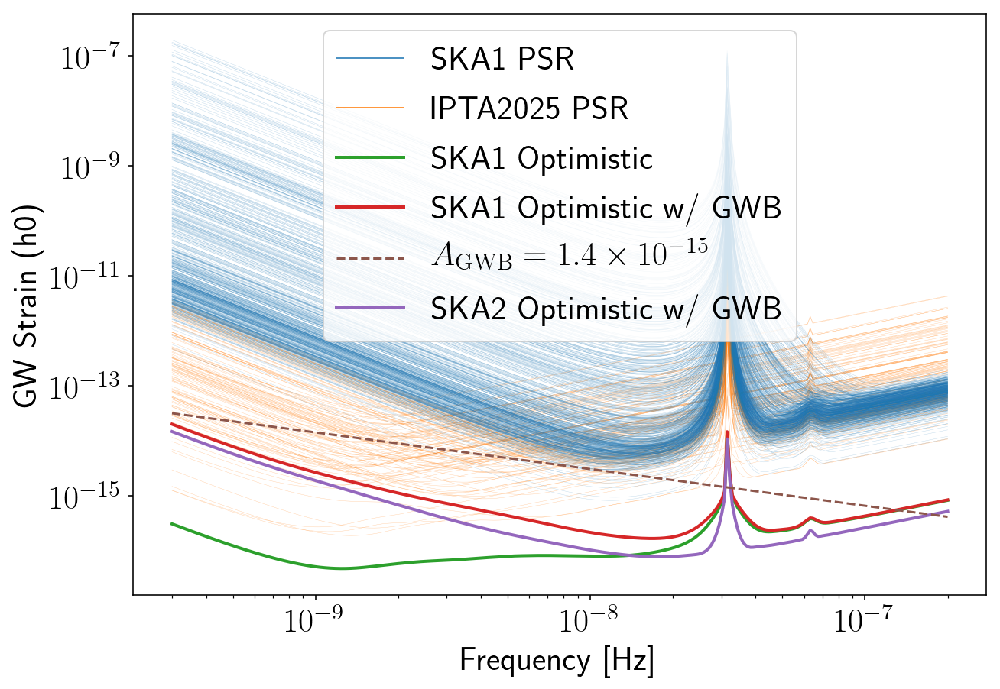

In [67]:
plt.figure(figsize=[10,7])

for sp in spec_ska1_opt:
    tspan=hsen.get_Tspan([sp])
    if tspan/(356.25*24*3600)<=4:
        color='C0'
        alpha = 0.3
    else:
        color='C1'
        alpha = 0.4
    plt.loglog(sp.freqs,3*np.sqrt(sp.S_I/tspan),lw=0.2,color=color,alpha=alpha)

a=plt.loglog(SM_ska1_opt.freqs,np.sqrt(np.mean(SM_ska1_opt.S_eff,axis=1)/SM_ska1_opt.Tspan),
             label='SKA1 Optimistic',color='C2',lw=2)
b=plt.loglog(SM_ska1_opt_wGWB.freqs, np.sqrt(np.mean(SM_ska1_opt_wGWB.S_eff,axis=1)/SM_ska1_opt_wGWB.Tspan),
             label='SKA1 Optimistic w/ GWB',lw=2,color='C3')
f=plt.loglog(SM_ska2_opt_wGWB.freqs, np.sqrt(np.mean(SM_ska2_opt_wGWB.S_eff,axis=1)/SM_ska2_opt_wGWB.Tspan),
             label='SKA2 Optimistic w/ GWB',lw=2,color='C4')

c=plt.loglog('','',lw=1,color='C0',alpha=0.8, label='SKA1 PSR')
d=plt.loglog('','',lw=1,color='C1',alpha=0.8, label='IPTA2025 PSR')
e=plt.loglog(freqs,(1.4e-15)*(freqs*365.25*24*3600)**(-2/3), linestyle='--',
             label=r'$A_{\rm GWB}=1.4\times 10^{-15}$',color='C5')

plt.legend(handles=[c[0],d[0],a[0],b[0],e[0],f[0]],loc='upper center')
plt.xlabel('Frequency [Hz]')
plt.ylabel('GW Strain (h0)')
plt.savefig('./SKA1_single_psr_wGWB_compare.pdf',bbox_inches='tight',dpi=150)
plt.show()

In [55]:
f10ns_idx = np.argmin(np.abs(1e-8-freqs))+1
freqs[f10ns_idx]

1.0165576447014804e-08

In [56]:
woGWB=np.sqrt(np.mean(SM_ska1_opt.S_eff,axis=1)[f10ns_idx]/SM_ska1_opt.Tspan)
wGWB=np.sqrt(np.mean(SM_ska1_opt_wGWB.S_eff,axis=1)[f10ns_idx]/SM_ska1_opt_wGWB.Tspan)
print(woGWB)
print(wGWB)
print(wGWB/woGWB)

7.910696917047851e-17
2.1006102206702427e-16
2.6554047547231243


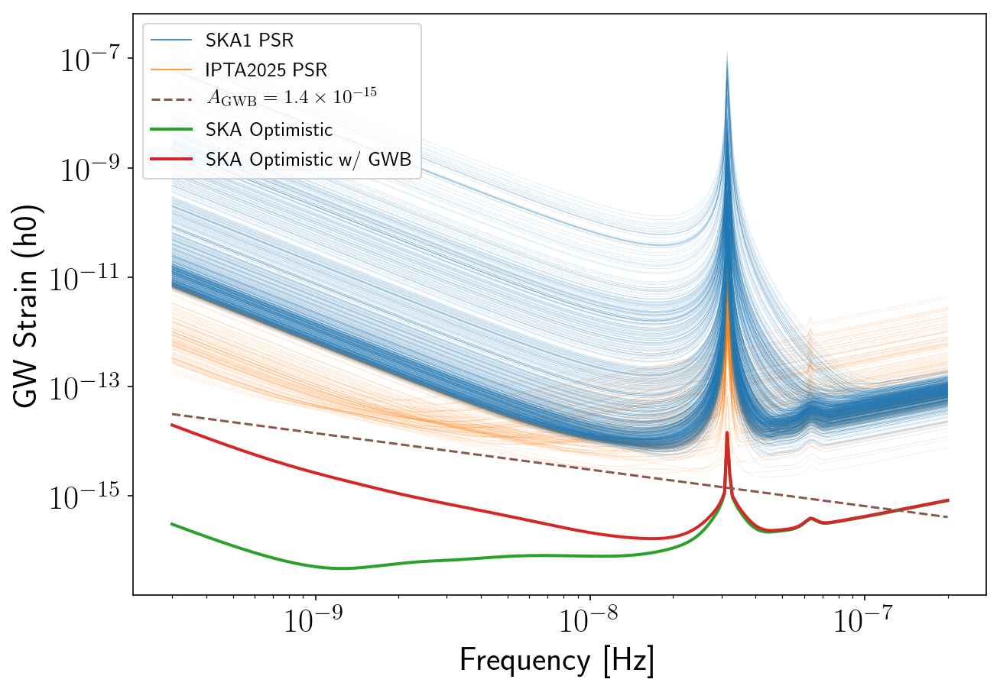

In [69]:
plt.figure(figsize=[10,7])

for sp in spec_ska1_opt_wGWB:
    tspan=hsen.get_Tspan([sp])
    if tspan/(356.25*24*3600)<=4:
        color='C0'
    else:
        color='C1'
    plt.loglog(sp.freqs,3*np.sqrt(sp.S_I/tspan),lw=0.2,color=color,alpha=0.3)

a=plt.loglog(SM_ska1_opt.freqs,np.sqrt(np.mean(SM_ska1_opt.S_eff,axis=1)/SM_ska1_opt.Tspan),
             label='SKA Optimistic',lw=2,color='C2')
b=plt.loglog(SM_ska1_opt_wGWB.freqs, np.sqrt(np.mean(SM_ska1_opt_wGWB.S_eff,axis=1)/SM_ska1_opt_wGWB.Tspan),
             label='SKA Optimistic w/ GWB',lw=2,color='C3')
c=plt.loglog('','',lw=1,color='C0',alpha=0.8, label='SKA1 PSR')
d=plt.loglog('','',lw=1,color='C1',alpha=0.8, label='IPTA2025 PSR')
e=plt.loglog(freqs,(1.4e-15)*(freqs*365.25*24*3600)**(-2/3), linestyle='--',
             label=r'$A_{\rm GWB}=1.4\times 10^{-15}$',color='C5')

plt.legend(handles=[c[0],d[0],e[0],a[0],b[0]],loc='upper left',fontsize=13)
plt.xlabel('Frequency [Hz]')
plt.ylabel('GW Strain (h0)')
# plt.savefig('./strain_sky_maps_11nHz.pdf',bbox_inches='tight',dpi=150)
plt.show()

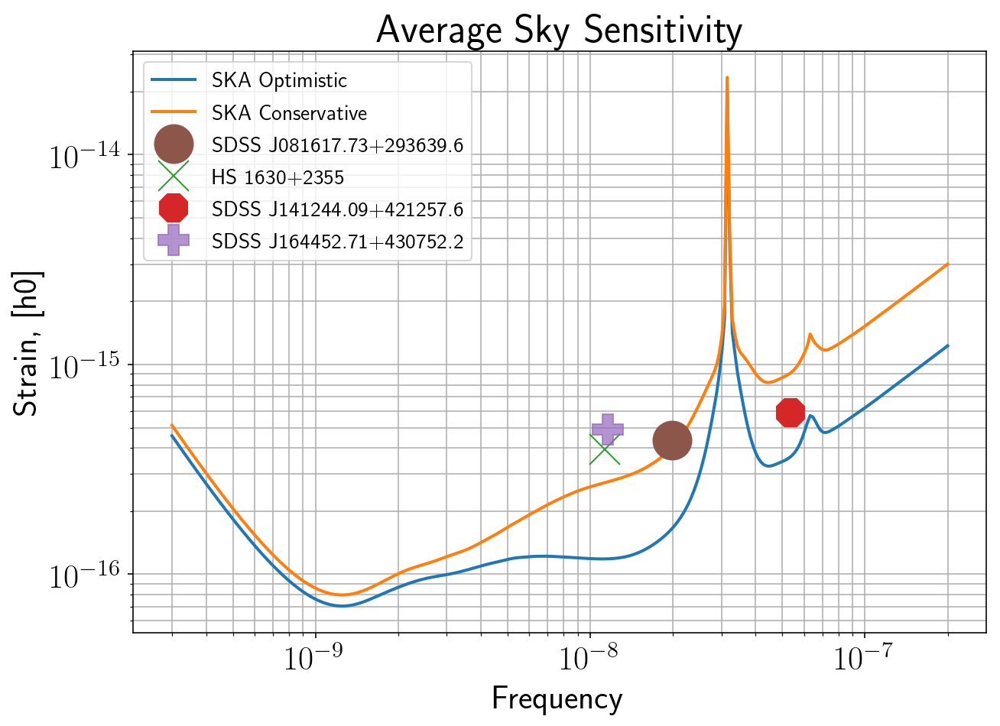

In [58]:
plt.figure(figsize=[10,7])
plt.loglog(SM_ska1_opt.freqs,sky_ave_detect(SM_ska1_opt,tspan_ska1_opt,3)/2,
           label='SKA Optimistic',lw=2)
plt.loglog(SM_ska1_cons.freqs,sky_ave_detect(SM_ska1_cons,tspan_ska1_cons,3)/2,
           label='SKA Conservative',lw=2)
plt.plot(1.99e-08, 4.37e-16,'.',markersize=50,color='C5',
         label='SDSS J081617.73+293639.6')
plt.plot(1.13e-08, 3.95e-16,'x',markersize=20,color='C2',
         label='HS 1630+2355')
plt.plot(5.34e-08, 5.89e-16,'8',markersize=20,color='C3',
         label='SDSS J141244.09+421257.6')
plt.plot(1.16e-08, 4.88e-16,'P',markersize=20,linewidth=3,alpha=0.7,color='C4',
         label='SDSS J164452.71+430752.2')

plt.legend(loc='upper left',fontsize=14)
plt.xlabel('Frequency')
plt.ylabel('Strain, [h0]')
plt.title('Average Sky Sensitivity')
plt.grid(which='both')
plt.show()

In [58]:
np.savetxt('ska1_opt_sky_ave_detect_snr3.txt',
           np.array((SM_ska1_opt.freqs,sky_ave_detect(SM_ska1_opt,tspan_ska1_opt,3)/2)).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')
np.savetxt('ska1_cons_sky_ave_detect_snr3.txt',
           np.array((SM_ska1_cons.freqs,sky_ave_detect(SM_ska1_cons,tspan_ska1_cons,3)/2)).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')

In [59]:
print(hsky.h0_circ(2.174e8, 120, 1.13e-8).to(''))
f0=1.13e-8
hcw = hsky.h_circ(2.174e8, 120, f0, tspan_ska1_opt, SM_ska1_opt.freqs).to('').value

3.9205730966276916e-16


In [60]:
h0=hsky.h0_circ(2.174e8, 120, 1.13e-8).to('').value
SkySNR_ska1_opt = SM_ska1_opt.SNR(h0)
SkySNR_ska1_cons = SM_ska1_cons.SNR(h0)

In [61]:
SkySNR_ska1_opt[fidx,sky_idx]

5.746030943613552

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


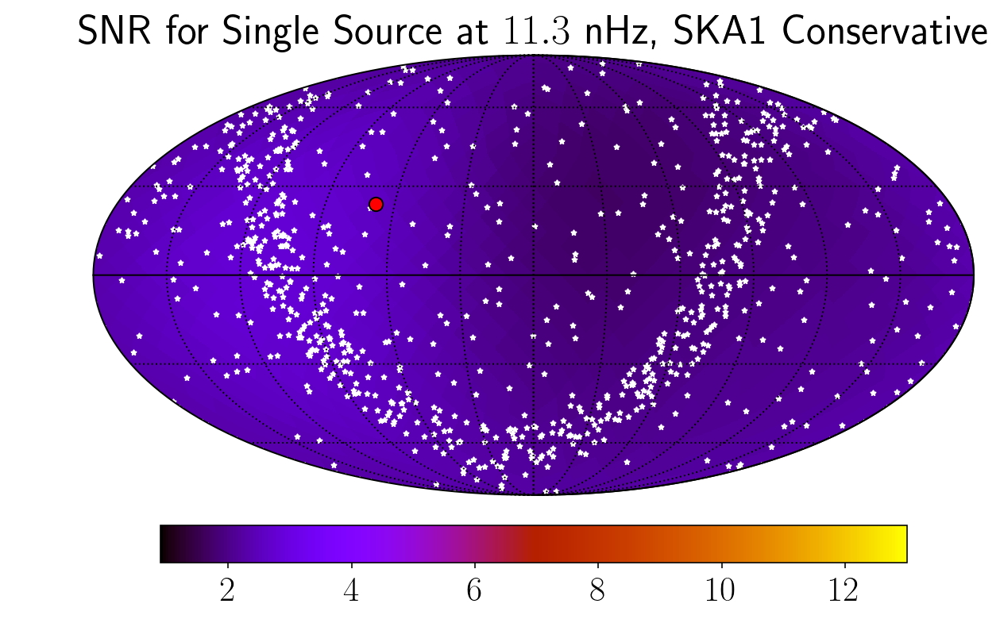

In [62]:
plt.rc('text', usetex=True)
hp.mollview(SkySNR_ska1_cons[fidx,:],rot=(180,0,0),
            cmap='gnuplot',cbar=None,title='',min=0.9,max=13.0)
hp.visufunc.projscatter(SM_ska1_cons.thetas, SM_ska1_cons.phis,marker='*',
                        color='white', edgecolors='white',s=10)
hp.visufunc.projscatter(np.pi/2-cand3.dec.to('rad').value, 
                        cand3.ra.to('rad').value,marker='.',
                        color='red', edgecolors='black', s=300)
hp.graticule()
fig = plt.gcf()
ax = plt.gca()
image = ax.get_images()[0]
cmap = fig.colorbar(image, ax=ax,orientation='horizontal',shrink=0.8,pad=0.05)

plt.rcParams.update({'font.size':22,'text.usetex':True})
ax.set_title("SNR for Single Source at $11.3$ nHz, SKA1 Conservative")
plt.show()

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


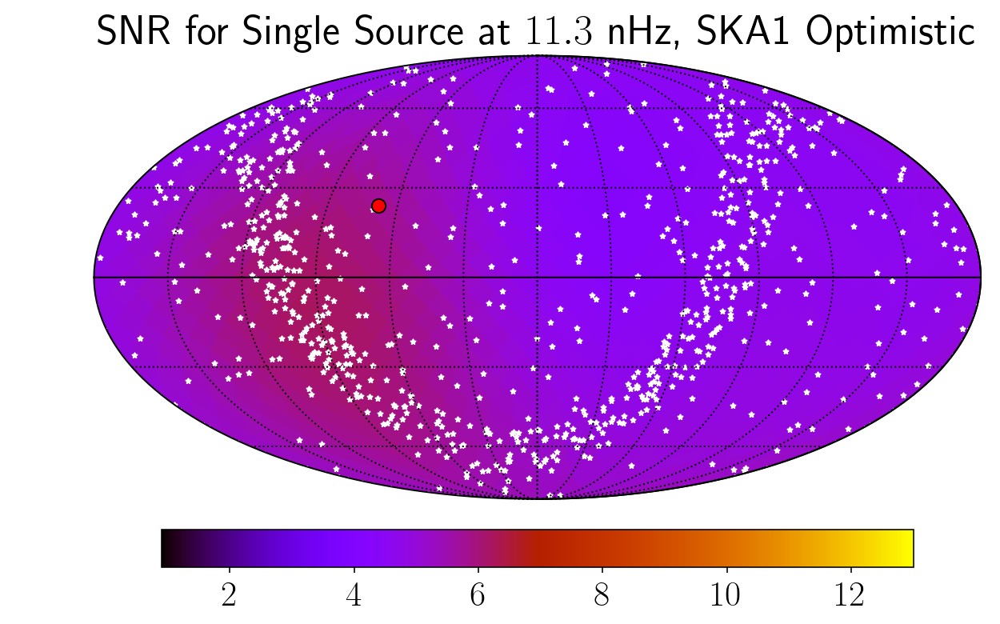

In [63]:
plt.rc('text', usetex=True)
hp.mollview(SkySNR_ska1_opt[fidx,:],rot=(180,0,0),#np.log10(1/SM.Sn[idx]),"SNR with Single Source"
            cmap='gnuplot',cbar=None,title='',min=0.9,max=13.0)
hp.visufunc.projscatter(SM_ska1_opt.thetas, SM_ska1_opt.phis,marker='*',
                        color='white', edgecolors='white',s=10)
hp.visufunc.projscatter(np.pi/2-cand3.dec.to('rad').value, cand3.ra.to('rad').value,marker='.',
                        color='red', edgecolors='black', s=300)


hp.graticule()
fig = plt.gcf()
ax = plt.gca()
image = ax.get_images()[0]
cmap = fig.colorbar(image, ax=ax,orientation='horizontal',shrink=0.8,pad=0.05)

plt.rcParams.update({'font.size':22,'text.usetex':True})
ax.set_title("SNR for Single Source at $11.3$ nHz, SKA1 Optimistic")
plt.show()

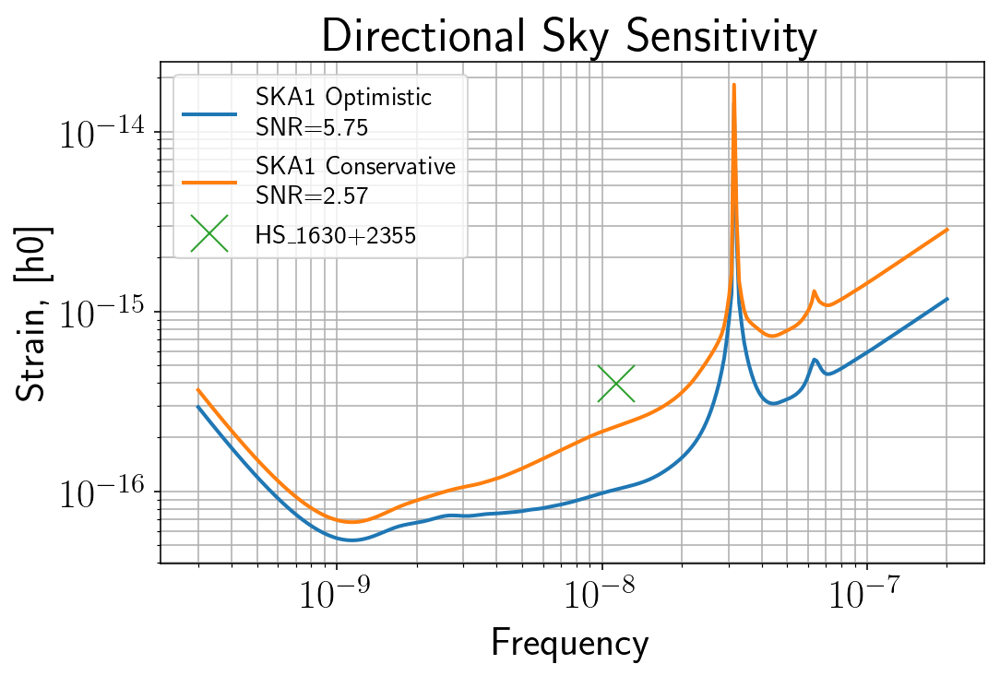

In [64]:
snr=3/2
plt.figure(figsize=[8,5])

plt.loglog(SM_ska1_opt.freqs,snr*np.sqrt(SM_ska1_opt.S_eff[:,sky_idx]/tspan_ska1_opt),
           label='SKA1 Optimistic\nSNR={0:1.2f}'.format(SkySNR_ska1_opt[fidx,sky_idx]),lw=2)
plt.loglog(SM_ska1_cons.freqs,snr*np.sqrt(SM_ska1_cons.S_eff[:,sky_idx]/tspan_ska1_cons),
           label='SKA1 Conservative\nSNR={0:1.2f}'.format(SkySNR_ska1_cons[fidx,sky_idx]),lw=2)
plt.plot(1.13e-08,3.95e-16,'x',markersize=20,color='C2',label='HS\_1630+2355')
plt.legend(loc='upper left',fontsize=14)
plt.xlabel('Frequency')
plt.ylabel('Strain, [h0]')
plt.title('Directional Sky Sensitivity')
plt.grid(which='both')
plt.show()

In [65]:
np.savetxt('ska1_opt_best_sky_detect_snr3.txt',
           np.array((SM_ska1_opt.freqs,3/2*np.sqrt(SM_ska1_opt.S_eff[:,sky_idx]/tspan_ska1_opt))).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')
np.savetxt('ska1_cons_best_sky_detect_snr3.txt',
           np.array((SM_ska1_cons.freqs,3/2*np.sqrt(SM_ska1_cons.S_eff[:,sky_idx]/tspan_ska1_cons))).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')

### SKA2

In [66]:
with open('ska2_cons_has_psrs.pkl','rb') as fin:
    ska2_cons = pickle.load(fin)
with open('ska2_opt_jitter_has_psrs.pkl','rb') as fin:
    ska2_opt = pickle.load(fin)

In [67]:
spec_ska2_opt = []
for p in tspan_filter(ska2_opt):
    sp = hsen.Spectrum(p, freqs=freqs)
    _ = sp.NcalInv
    spec_ska2_opt.append(sp)

In [68]:
spec_ska2_cons = []
for p in tspan_filter(ska2_cons):
    sp = hsen.Spectrum(p, freqs=freqs)
    _ = sp.NcalInv
    spec_ska2_cons.append(sp)

In [69]:
SM_ska2_opt = hsky.SkySensitivity(spec_ska2_opt, theta_gw, phi_gw)#, pulsar_term=True)
SM_ska2_cons = hsky.SkySensitivity(spec_ska2_cons,theta_gw, phi_gw)
tspan_ska2_opt = SM_ska2_opt.Tspan
tspan_ska2_cons = SM_ska2_cons.Tspan

In [70]:
print(hsky.h0_circ(2.174e8, 120, 1.13e-8).to(''))
f0 = 1.13e-8
hcw = hsky.h_circ(2.174e8, 120, f0, tspan_ska2_opt, SM_ska2_opt.freqs).to('').value

3.9205730966276916e-16


In [71]:
h0=hsky.h0_circ(2.174e8, 120, 1.13e-8).to('').value
SkySNR_ska2_opt = SM_ska2_opt.SNR(h0)
SkySNR_ska2_cons = SM_ska2_cons.SNR(h0)

In [72]:
SkySNR_ska2_opt[fidx,sky_idx]

12.685466604224182

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


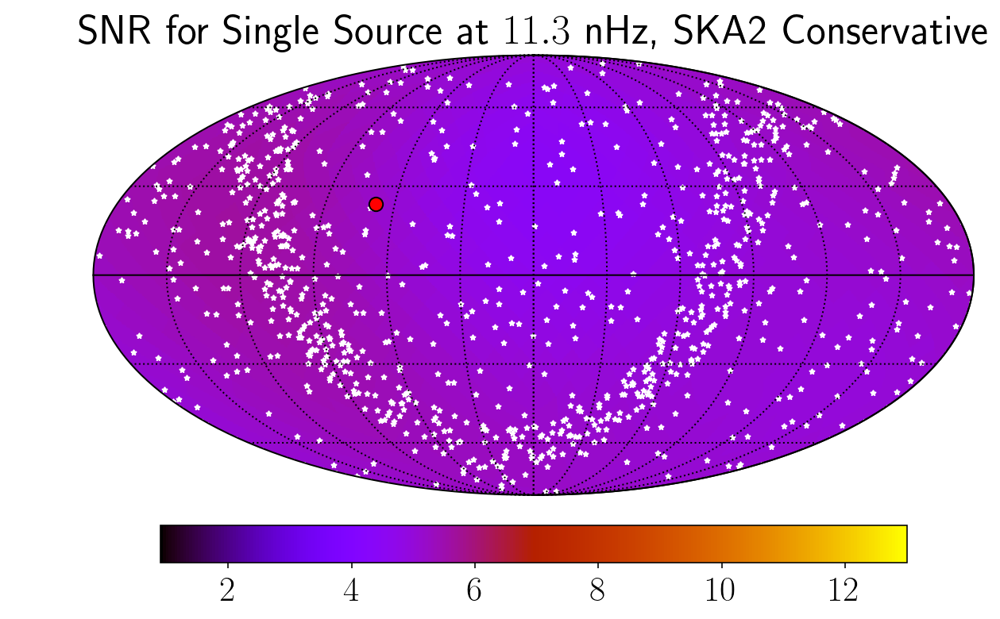

In [73]:
plt.rc('text', usetex=True)
hp.mollview(SkySNR_ska2_cons[fidx,:],rot=(180,0,0),#np.log10(1/SM.Sn[idx]),"SNR with Single Source"
            cmap='gnuplot',cbar=None,title='',min=0.9,max=13.0)
hp.visufunc.projscatter(SM_ska2_cons.thetas, SM_ska2_cons.phis,marker='*',
                        color='white', edgecolors='white',s=10)
hp.visufunc.projscatter(np.pi/2-cand3.dec.to('rad').value, cand3.ra.to('rad').value,marker='.',
                        color='red', edgecolors='black', s=300)


hp.graticule()
fig = plt.gcf()
ax = plt.gca()
image = ax.get_images()[0]
cmap = fig.colorbar(image, ax=ax,orientation='horizontal',shrink=0.8,pad=0.05)

plt.rcParams.update({'font.size':22,'text.usetex':True})
ax.set_title("SNR for Single Source at $11.3$ nHz, SKA2 Conservative")
plt.show()

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


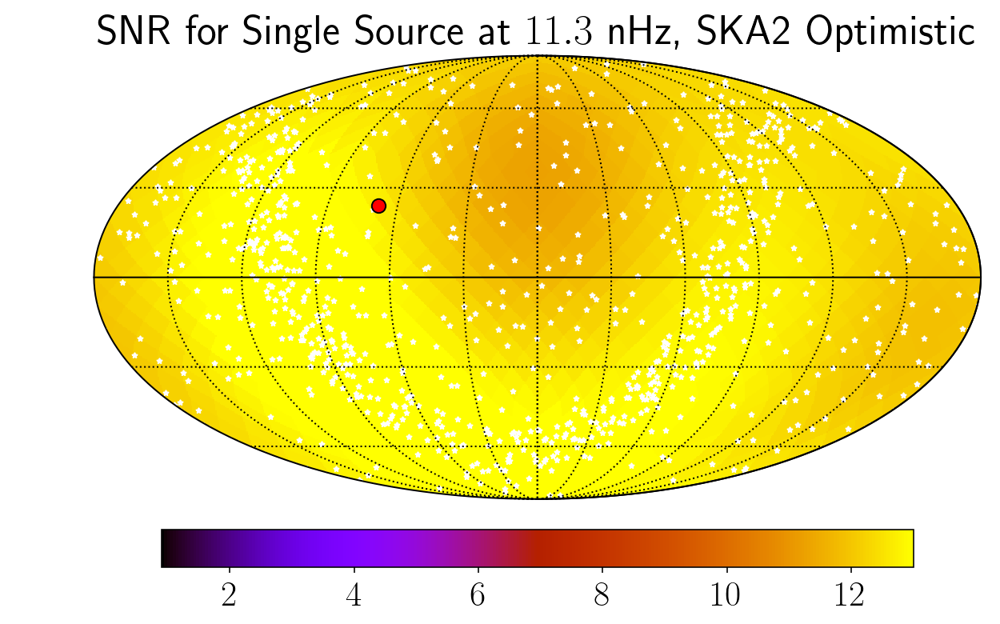

In [74]:
plt.rc('text', usetex=True)
hp.mollview(SkySNR_ska2_opt[fidx,:],rot=(180,0,0),#np.log10(1/SM.Sn[idx]),"SNR with Single Source"
            cmap='gnuplot',cbar=None,title='',min=0.9,max=13.0)
hp.visufunc.projscatter(SM_ska2_opt.thetas, SM_ska2_opt.phis,marker='*',
                        color='white', edgecolors='white',s=10)
hp.visufunc.projscatter(np.pi/2-cand3.dec.to('rad').value, cand3.ra.to('rad').value,marker='.',
                        color='red', edgecolors='black', s=300)


hp.graticule()
fig = plt.gcf()
ax = plt.gca()
image = ax.get_images()[0]
cmap = fig.colorbar(image, ax=ax,orientation='horizontal',shrink=0.8,pad=0.05)

plt.rcParams.update({'font.size':22,'text.usetex':True})
ax.set_title("SNR for Single Source at $11.3$ nHz, SKA2 Optimistic")
plt.show()

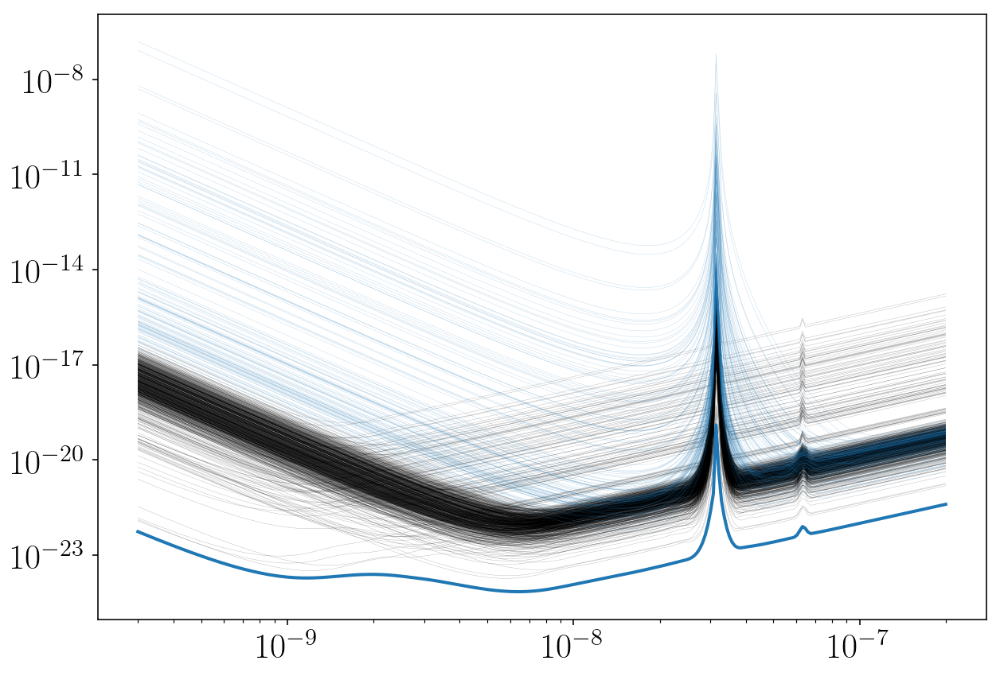

In [75]:
plt.figure(figsize=[10,7])
for sp in spec_ska2_opt:
    tspan=hsen.get_Tspan([sp])

    if tspan/(356.25*24*3600)<=4:
        color='C0'
    else:
        color='k'
    plt.loglog(sp.freqs,sp.S_I,lw=0.2,color=color,alpha=0.3)
# plt.loglog(sp.freqs,1e-15*(sp.freqs*365.25*24*3600)**(-2/3),label=r'GWB, $A_{\rm GWB}=10^{-15}$')
plt.loglog(SM_ska2_opt.freqs,SM_ska2_opt.S_eff_mean,
           label='SKA Optimistic',lw=2)

plt.show()

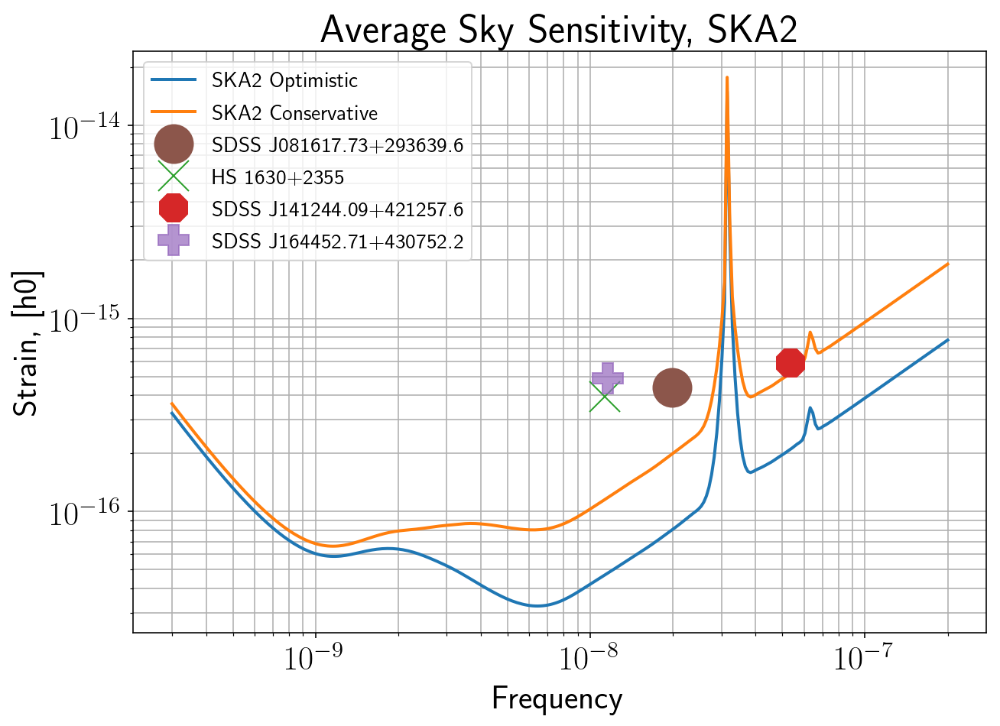

In [76]:
plt.figure(figsize=[10,7])
plt.loglog(SM_ska2_opt.freqs,sky_ave_detect(SM_ska2_opt,tspan_ska2_opt,3)/2,
           label='SKA2 Optimistic',lw=2)
plt.loglog(SM_ska2_cons.freqs,sky_ave_detect(SM_ska2_cons,tspan_ska2_cons,3)/2,
           label='SKA2 Conservative',lw=2)
plt.plot(1.99e-08, 4.37e-16,'.',markersize=50,color='C5',label='SDSS J081617.73+293639.6')
plt.plot(1.13e-08, 3.95e-16,'x',markersize=20,color='C2',label='HS 1630+2355')
plt.plot(5.34e-08, 5.89e-16,'8',markersize=20,color='C3',label='SDSS J141244.09+421257.6')
plt.plot(1.16e-08, 4.88e-16,'P',markersize=20,linewidth=3,alpha=0.7,color='C4',label='SDSS J164452.71+430752.2')

# plt.loglog(SM_ska_opt.freqs,1e-15*(SM_ska_opt.freqs*365.25*24*3600)**(-2/3),label=r'GWB, $A_{\rm GWB}=10^{-15}$')
# plt.axvline(1.13e-8,lw=3,linestyle='--',color='k')
plt.legend(loc='upper left',fontsize=14)
plt.xlabel('Frequency')
plt.ylabel('Strain, [h0]')
plt.title('Average Sky Sensitivity, SKA2')
plt.grid(which='both')
plt.show()

In [77]:
np.savetxt('ska2_opt_sky_ave_detect_snr3.txt',
           np.array((SM_ska2_opt.freqs,sky_ave_detect(SM_ska2_opt,tspan_ska2_opt,3)/2)).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')
np.savetxt('ska2_cons_sky_ave_detect_snr3.txt',
           np.array((SM_ska2_cons.freqs,sky_ave_detect(SM_ska2_cons,tspan_ska2_cons,3)/2)).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')

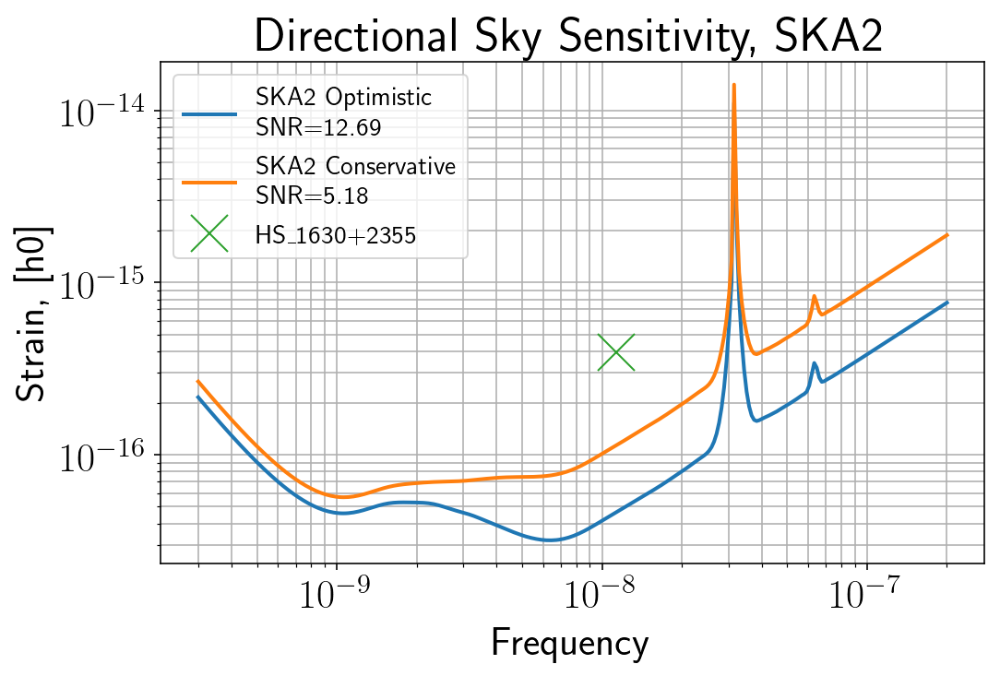

In [78]:
snr=3/2
plt.figure(figsize=[8,5])

plt.loglog(SM_ska2_opt.freqs,snr*np.sqrt(SM_ska2_opt.S_eff[:,sky_idx]/tspan_ska2_opt),
           label='SKA2 Optimistic\nSNR={0:1.2f}'.format(SkySNR_ska2_opt[fidx,sky_idx]),lw=2)
plt.loglog(SM_ska2_cons.freqs,snr*np.sqrt(SM_ska2_cons.S_eff[:,sky_idx]/tspan_ska2_cons),
           label='SKA2 Conservative\nSNR={0:1.2f}'.format(SkySNR_ska2_cons[fidx,sky_idx]),lw=2)
plt.plot(1.13e-08,3.95e-16,'x',markersize=20,color='C2',label='HS\_1630+2355')
plt.legend(loc='upper left',fontsize=14)
plt.xlabel('Frequency')
plt.ylabel('Strain, [h0]')
plt.title('Directional Sky Sensitivity, SKA2')
plt.grid(which='both')
plt.show()

In [79]:
np.savetxt('ska2_opt_best_sky_detect_snr3.txt',
           np.array((SM_ska2_opt.freqs,3/2*np.sqrt(SM_ska2_opt.S_eff[:,sky_idx]/tspan_ska2_opt))).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')
np.savetxt('ska2_cons_best_sky_detect_snr3.txt',
           np.array((SM_ska2_cons.freqs,3/2*np.sqrt(SM_ska2_cons.S_eff[:,sky_idx]/tspan_ska2_cons))).T,
           fmt='%.18e %.18e',header='freq[Hz] gw_strain')

In [80]:
fidx = np.argmin(np.abs(SM_ska2_opt.freqs-f0))
SM_ska2_opt.freqs[fidx]

1.13e-08

In [81]:
# SM_ska2_opt.SNR()

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


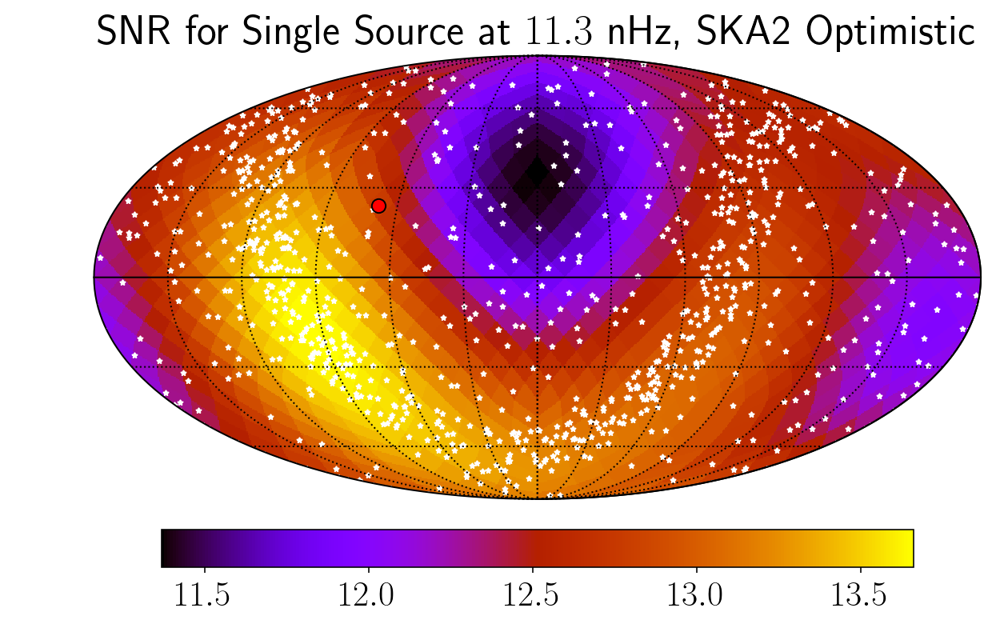

In [82]:
plt.rc('text', usetex=True)
hp.mollview(3.95e-16/sky_detect(SM_ska2_opt,tspan_ska2_opt,snr=1)[fidx,:],rot=(180,0,0),#np.log10(1/SM.Sn[idx]),"SNR with Single Source"
            cmap='gnuplot',cbar=None,title='')
hp.visufunc.projscatter(SM_ska2_opt.thetas, SM_ska2_opt.phis,marker='*',
                        color='white', edgecolors='white',s=10)
hp.visufunc.projscatter(np.pi/2-cand3.dec.to('rad').value, cand3.ra.to('rad').value,marker='.',
                        color='red', edgecolors='black', s=300)


hp.graticule()
fig = plt.gcf()
ax = plt.gca()
image = ax.get_images()[0]
cmap = fig.colorbar(image, ax=ax,orientation='horizontal',shrink=0.8,pad=0.05)

plt.rcParams.update({'font.size':22,'text.usetex':True})
ax.set_title("SNR for Single Source at $11.3$ nHz, SKA2 Optimistic")
plt.show()

## Sky Maps

In [83]:
ska1_mean = SkySNR_ska1_opt
ska2_mean = SkySNR_ska2_opt

In [84]:
# phi = [p.phi for p in ng11]

In [85]:
def discrete_cmap(N, base_cmap=None):
    """Create an N-bin discrete colormap from the specified input map"""

    # Note that if base_cmap is a string or None, you can simply do
    #    return plt.cm.get_cmap(base_cmap, N)
    # The following works for string, None, or a colormap instance:

#     base = plt.cm.get_cmap(base_cmap)
#     color_list = base(np.linspace(0, 1, N))
#     cmap_name = base.name + str(N)
    return plt.cm.get_cmap(base_cmap, N)#base.from_list(cmap_name, color_list, N)

In [86]:
Min = SkySNR_ng11[fidx,:].min()
Max = ska2_mean[fidx,:].max()
# norm = mpl.colors.Normalize(vmin=Min, vmax=Max)
# cmap = cm.viridis#Reds
# x = 9

# m = cm.ScalarMappable(norm=norm, cmap=cmap)
# # print(m.to_rgba(x))
# cmap = discrete_cmap(26,'RdYlBu')#'cubehelix'
cmap = 'YlGnBu'#'viridis'#'RdYlBu'#'PRGn'#'viridis'#'cubehelix'
skymap = np.linspace(Min, Max, SkySNR_ska2_opt[fidx,:].size)
mappable = plot.healpix_heatmap(skymap, cmap=cmap,vmin=Min, vmax=Max)
plt.close()

In [87]:
def mpl_mwp_coords(phi,theta):
    if not isinstance(phi,(list,np.ndarray)):
        phi = [phi]
    x = np.array([p+2*np.pi if p <0 else p for p in phi])
    y = np.pi/2-theta
    return x, y

/Users/hazboun/anaconda3/envs/skymaps/lib/python3.7/site-packages/matplotlib/projections/geo.py:421: RuntimeWarning: invalid value encountered in arcsin
  theta = np.arcsin(y / np.sqrt(2))


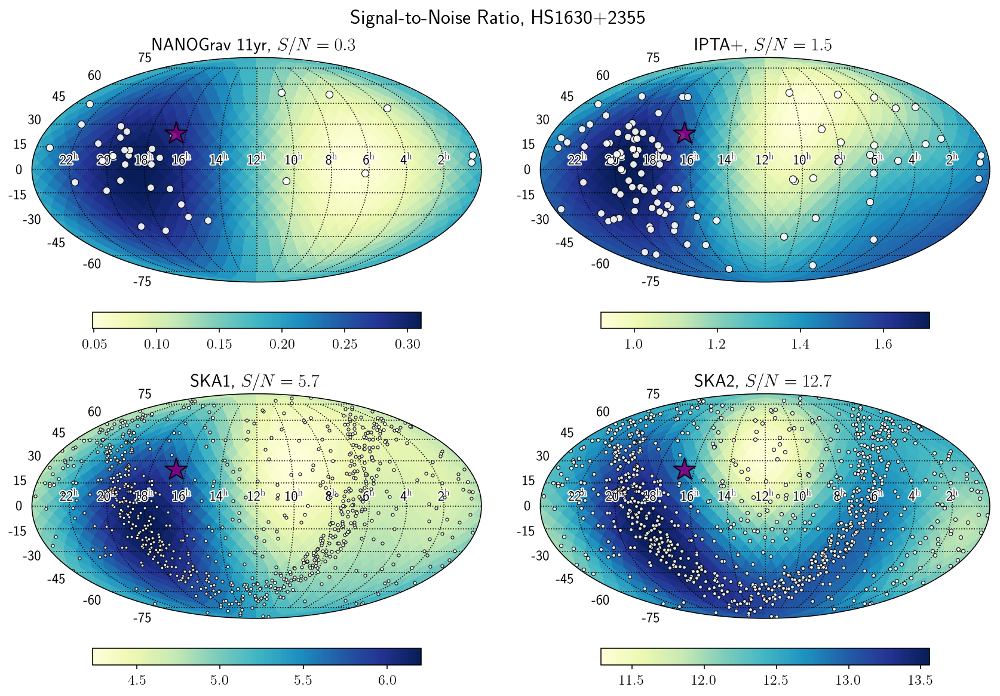

In [92]:
fig = plt.figure(figsize=[12,8])
orient = 'horizontal'#'vertical'#
shrink = 0.7
plt.rcParams['font.size'] = 12
ax = plt.subplot(221, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax.grid()
plot.outline_text(ax)
mp0 = plot.healpix_heatmap(SkySNR_ng11[fidx,:], cmap=cmap)#, vmin=Min, vmax=Max)

ng11_sky = mpl_mwp_coords(SM_ng11.phis,SM_ng11.thetas)

cand3_sky = mpl_mwp_coords(cand3.ra.to('rad').value,np.pi/2-cand3.dec.to('rad').value)
for ii in range(ng11_sky[0].size):
    ax.plot(ng11_sky[0][ii],ng11_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=6, mew=0.6, mec='black', alpha=0.9)
    
ax.plot(cand3_sky[0][0],cand3_sky[1],
            marker='*', linestyle='none', color='purple',
            markersize=20, mew=1, mec='black', alpha=0.9)

plt.title('NANOGrav 11yr, $S/N={0:1.1f}$'.format(SkySNR_ng11[fidx,sky_idx]),fontsize=15)
plt.grid(linestyle='dotted', color='black')
fig.colorbar(mp0, orientation=orient, shrink=shrink, pad=0.10)

ax1 = plt.subplot(222, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax1.grid()
plot.outline_text(ax1)
# ax1.set_facecolor(m.to_rgba(np.log10(total_power_ng9yr['marg_power'][-1])))
mp1 = plot.healpix_heatmap(SkySNR_ipta_plus[fidx,:], cmap=cmap)#, vmin=Min, vmax=Max)
ipta_sky = mpl_mwp_coords(SM_ipta_plus.phis,SM_ipta_plus.thetas)
for ii in range(ipta_sky[0].size):
    ax1.plot(ipta_sky[0][ii],ipta_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=6, mew=0.6, mec='black', alpha=0.9)
ax1.plot(cand3_sky[0][0],cand3_sky[1],
            marker='*', linestyle='none', color='purple',
            markersize=20, mew=1, mec='black', alpha=0.9)
    
plt.title('IPTA+, $S/N={0:1.1f}$'.format(SkySNR_ipta_plus[fidx,sky_idx]),fontsize=15)
plt.grid(linestyle='dotted', color='k')
fig.colorbar(mp1, orientation=orient, shrink=shrink, pad=0.10)

ax2 = plt.subplot(223, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax2.grid()
plot.outline_text(ax2)
mp2 = plot.healpix_heatmap(ska1_mean[fidx,:], cmap=cmap)#, vmin=Min, vmax=Max)
ska1_sky = mpl_mwp_coords(SM_ska1_opt.phis,SM_ska1_opt.thetas)
for ii in range(ska1_sky[0].size):
    ax2.plot(ska1_sky[0][ii],ska1_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=2.5, mew=0.6, mec='black', alpha=0.9)
ax2.plot(cand3_sky[0][0],cand3_sky[1],
            marker='*', linestyle='none', color='purple',
            markersize=20, mew=1, mec='black', alpha=0.9)
plt.title('SKA1, $S/N={0:1.1f}$'.format(ska1_mean[fidx,sky_idx]),fontsize=15)
plt.grid(linestyle='dotted', color='k')
fig.colorbar(mp2, orientation=orient, shrink=shrink, pad=0.10)

ax3 = plt.subplot(224, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax3.grid()
plot.outline_text(ax3)
# ax2.set_facecolor(m.to_rgba(np.log10(total_power_ng11yr['marg_power'][-1])))
mp3 = plot.healpix_heatmap(ska2_mean[fidx,:], cmap=cmap)#, vmin=Min, vmax=Max)
ska2_sky = mpl_mwp_coords(SM_ska2_opt.phis,SM_ska2_opt.thetas)
for ii in range(ska2_sky[0].size):
    ax3.plot(ska2_sky[0][ii],ska2_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=3, mew=0.6, mec='black', alpha=0.9)
ax3.plot(cand3_sky[0][0],cand3_sky[1],
            marker='*', linestyle='none', color='purple',
            markersize=20, mew=1, mec='black', alpha=0.9)  
plt.title('SKA2, $S/N={0:1.1f}$'.format(ska2_mean[fidx,sky_idx]),fontsize=15)
plt.grid(linestyle='dotted', color='k')


# ax3 = plt.subplot(224)
# plt.title('$\log_{10}$(RN Power)',y=0.65,fontsize=14)
# ax3.axis('off')

plt.grid(linestyle='dotted', color='k')
#ax.set_title(r'NANOGrav 9-year Continuous Wave Limits at 8 nHz')
#fig.subplots_adjust(bottom=0.8)
# cbar_ax = fig.add_axes([0.33, 0.48, 0.33, 0.05])
# cbar_lines = [np.log10(total_power_ng5yr['marg_power'][-1]),
#               np.log10(total_power_ng9yr['marg_power'][-1]),
#               np.log10(total_power_ng11yr['marg_power'][-1])]
# cbar_ax.set_title('S/N',fontsize=15)
cbar_ticks=np.arange(14)
# fig.colorbar(mappable, cax=cbar_ax, orientation='horizontal',ticks=cbar_ticks)
fig.colorbar(mp3, orientation=orient, shrink=shrink, pad=0.10)#,ticks=cbar_ticks)
# cbar_ax.axvline(cbar_lines[0],color='white',linestyle='--',linewidth=0.7)#, 'w',linestyle='--')
# cbar_ax.axvline(cbar_lines[1],color='white',linestyle='--',linewidth=0.7)
# cbar_ax.axvline(cbar_lines[2],color='white',linestyle='--',linewidth=0.7)
#cb.ax.plot(cbar_lines[0], 'w',linestyle='--')
#cb.ax.plot(cbar_lines[1], 'w',linestyle='--')
#cb.ax.plot(cbar_lines[2], 'w',linestyle='--')
fig.suptitle('Signal-to-Noise Ratio, HS1630+2355', y=1.02, fontsize=17)


plt.tight_layout(pad=1.05)

# plt.legend()
# plt.savefig('./snr_sky_maps_HS1630+2355.pdf',bbox_inches='tight',dpi=150)
plt.show()

In [93]:
fidx=np.argmin(np.abs(freqs-11e-9))
fidx

166

In [277]:
len(psrs_sim_dr2)

63

/Users/hazboun/anaconda3/envs/skymaps/lib/python3.7/site-packages/matplotlib/projections/geo.py:421: RuntimeWarning: invalid value encountered in arcsin
  theta = np.arcsin(y / np.sqrt(2))
/Users/hazboun/anaconda3/envs/skymaps/lib/python3.7/site-packages/matplotlib/textpath.py:349: UserWarning: The glyph (176) of font (/usr/local/texlive/2018/texmf-dist/fonts/type1/public/cm-super/sfss3583.pfb) cannot be converted with the encoding. Glyph may be wrong
  "be wrong" % (glyph, font.fname))


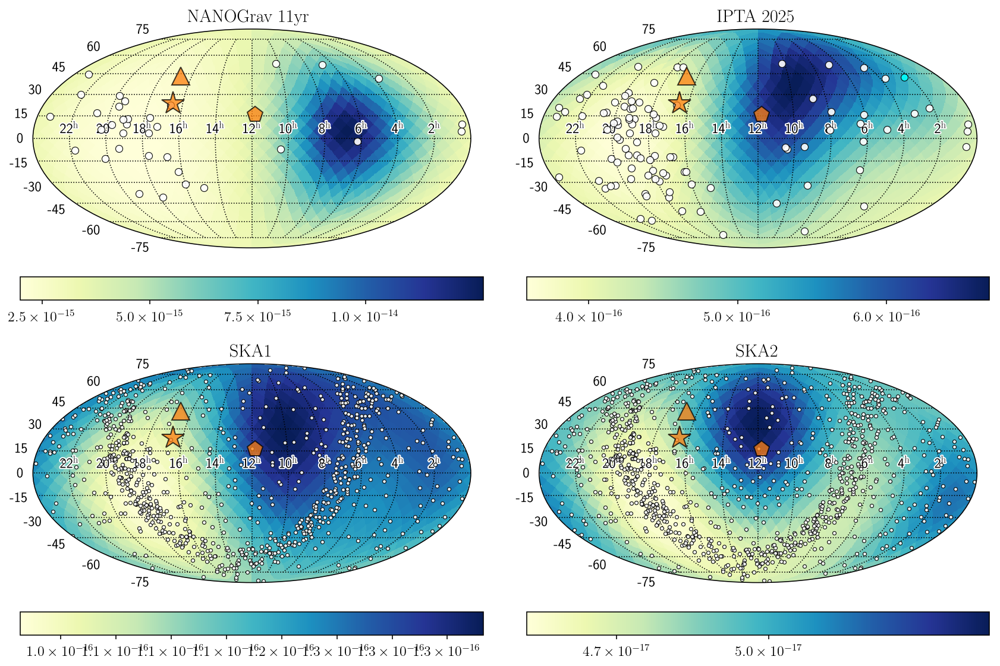

In [279]:
cmap = 'YlGnBu'#'viridis_r'#'cividis_r'#'YlGnBu'#'RdYlBu'#'PRGn'#'viridis'#'cubehelix'
snr = 3
snr /= 2
fig = plt.figure(figsize=[12,8])
orient = 'horizontal'#'vertical'#
shrink = 1
cand_color='C1'#'orchid'
marker_alpha = 0.75
plt.rcParams['font.size'] = 12
def fmt(x, pos):
    a, b = '{:.1e}'.format(x).split('e')
    b = int(b)
    return r'${} \times 10^{{{}}}$'.format(a, b)


ax = plt.subplot(221, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax.grid()
plot.outline_text(ax)
mp0 = plot.healpix_heatmap(snr*np.sqrt(SM_ng11.S_eff[fidx,:]/SM_ng11.Tspan),
                           cmap=cmap)#, vmin=1e-16)#, vmax=Max)

ng11_sky = mpl_mwp_coords(SM_ng11.phis,SM_ng11.thetas)
cand1_sky = mpl_mwp_coords(cand1.ra.to('rad').value,np.pi/2-cand1.dec.to('rad').value)
cand2_sky = mpl_mwp_coords(cand2.ra.to('rad').value,np.pi/2-cand2.dec.to('rad').value)
cand3_sky = mpl_mwp_coords(cand3.ra.to('rad').value,np.pi/2-cand3.dec.to('rad').value)
for ii in range(ng11_sky[0].size):
    ax.plot(ng11_sky[0][ii],ng11_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=6, mew=0.6, mec='black', alpha=0.9)
    
ax.plot(cand1_sky[0][0],cand1_sky[1],
            marker='^', linestyle='none', color=cand_color,
            markersize=15, mew=1, mec='black', alpha=marker_alpha)
ax.plot(cand2_sky[0][0],cand2_sky[1],
            marker='p', linestyle='none', color=cand_color,
            markersize=14, mew=1, mec='black', alpha=marker_alpha)
ax.plot(cand3_sky[0][0],cand3_sky[1],
            marker='*', linestyle='none', color=cand_color,
            markersize=20, mew=1, mec='black', alpha=marker_alpha)

plt.title(r'\rm{NANOGrav 11yr}',fontsize=15)
plt.grid(linestyle='dotted', color='black')
cb0_ticks=[2.5e-15,5e-15,7.5e-15,1e-14]
fig.colorbar(mp0, orientation=orient, shrink=shrink, pad=0.10,ticks=cb0_ticks, 
             format=ticker.FuncFormatter(fmt))

ax1 = plt.subplot(222, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax1.grid()
plot.outline_text(ax1)
# ax1.set_facecolor(m.to_rgba(np.log10(total_power_ng9yr['marg_power'][-1])))
mp1 = plot.healpix_heatmap(snr*np.sqrt(SM_ipta_plus.S_eff[fidx,:]/SM_ipta_plus.Tspan),
                           cmap=cmap)#, vmin=1e-16,
#                            vmax=(snr*np.sqrt(SM_ipta_plus.S_eff[fidx,:]/SM_ipta_plus.Tspan).max()))
ipta_sky = mpl_mwp_coords(SM_ipta_plus.phis,SM_ipta_plus.thetas)
for ii in range(ipta_sky[0].size):
    if ii==3:
        ax1.plot(ipta_sky[0][ii],ipta_sky[1][ii],
                marker='o', linestyle='none', color='cyan',
                markersize=6, mew=0.6, mec='black', alpha=0.9)
    else:
        ax1.plot(ipta_sky[0][ii],ipta_sky[1][ii],
                marker='o', linestyle='none', color='white',
                markersize=6, mew=0.6, mec='black', alpha=0.9)
ax1.plot(cand1_sky[0][0],cand1_sky[1],
            marker='^', linestyle='none', color=cand_color,
            markersize=15, mew=1, mec='black', alpha=marker_alpha)
ax1.plot(cand2_sky[0][0],cand2_sky[1],
            marker='p', linestyle='none', color=cand_color,
            markersize=14, mew=1, mec='black', alpha=marker_alpha)
ax1.plot(cand3_sky[0][0],cand3_sky[1],
            marker='*', linestyle='none', color=cand_color,
            markersize=20, mew=1, mec='black', alpha=marker_alpha)
    
plt.title(r'\rm{IPTA 2025}',fontsize=15)
plt.grid(linestyle='dotted', color='k')
cb1_ticks=[4e-16,5e-16,6e-16]
fig.colorbar(mp1, orientation=orient, shrink=shrink, pad=0.10,ticks=cb1_ticks, 
             format=ticker.FuncFormatter(fmt))

ax2 = plt.subplot(223, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax2.grid()
plot.outline_text(ax2)
mp2 = plot.healpix_heatmap(snr*np.sqrt(SM_ska1_opt.S_eff[fidx,:]/SM_ska1_opt.Tspan), 
                           cmap=cmap)#, vmin=Min, vmax=Max)
ska1_sky = mpl_mwp_coords(SM_ska1_opt.phis,SM_ska1_opt.thetas)
for ii in range(ska1_sky[0].size):
    ax2.plot(ska1_sky[0][ii],ska1_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=3, mew=0.6, mec='black', alpha=0.9)
ax2.plot(cand1_sky[0][0],cand1_sky[1],
            marker='^', linestyle='none', color=cand_color,
            markersize=15, mew=1, mec='black', alpha=marker_alpha)
ax2.plot(cand2_sky[0][0],cand2_sky[1],
            marker='p', linestyle='none', color=cand_color,
            markersize=14, mew=1, mec='black', alpha=marker_alpha)
ax2.plot(cand3_sky[0][0],cand3_sky[1],
            marker='*', linestyle='none', color=cand_color,
            markersize=20, mew=1, mec='black', alpha=marker_alpha)

plt.title(r'\rm{SKA1}',fontsize=15)
plt.grid(linestyle='dotted', color='k')
fig.colorbar(mp2, orientation=orient, shrink=shrink, pad=0.10, format=ticker.FuncFormatter(fmt))

ax3 = plt.subplot(224, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax3.grid()
plot.outline_text(ax3)
# ax2.set_facecolor(m.to_rgba(np.log10(total_power_ng11yr['marg_power'][-1])))
mp3 = plot.healpix_heatmap(snr*np.sqrt(SM_ska2_opt.S_eff[fidx,:]/SM_ska2_opt.Tspan), cmap=cmap)#, vmin=Min, vmax=Max)
ska2_sky = mpl_mwp_coords(SM_ska2_opt.phis,SM_ska2_opt.thetas)
for ii in range(ska2_sky[0].size):
    ax3.plot(ska2_sky[0][ii],ska2_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=3, mew=0.6, mec='black', alpha=0.9)
p1=ax3.plot(cand1_sky[0][0],cand1_sky[1],
            marker='^', linestyle='none', color=cand_color,
            markersize=15, mew=1, mec='black', alpha=marker_alpha,
         label='SDSS J164452.71+430752.2')
p2=ax3.plot(cand2_sky[0][0],cand2_sky[1],
           marker='p', linestyle='none', color=cand_color,
            markersize=14, mew=1, mec='black', alpha=marker_alpha,
         label='SDSS J081617.73+293639.6')
p3=ax3.plot(cand3_sky[0][0],cand3_sky[1],
            marker='*', linestyle='none', color=cand_color,
            markersize=20, mew=1, mec='black', alpha=marker_alpha,
         label='HS 1630+2355') 

plt.title(r'\rm{SKA2}',fontsize=15)
plt.grid(linestyle='dotted', color='k')


# ax3 = plt.subplot(224)
# plt.title('$\log_{10}$(RN Power)',y=0.65,fontsize=14)
# ax3.axis('off')

plt.grid(linestyle='dotted', color='k')
#ax.set_title(r'NANOGrav 9-year Continuous Wave Limits at 8 nHz')
#fig.subplots_adjust(bottom=0.8)
# cbar_ax = fig.add_axes([0.33, 0.48, 0.33, 0.05])
# cbar_lines = [np.log10(total_power_ng5yr['marg_power'][-1]),
#               np.log10(total_power_ng9yr['marg_power'][-1]),
#               np.log10(total_power_ng11yr['marg_power'][-1])]
# cbar_ax.set_title('S/N',fontsize=15)
cb3_ticks=[4.4e-17,4.7e-17,5.0e-17]
# fig.colorbar(mappable, cax=cbar_ax, orientation='horizontal',ticks=cbar_ticks)
cb3=fig.colorbar(mp3, orientation=orient, shrink=shrink, ticks=cb3_ticks,
                 pad=0.10, format=ticker.FuncFormatter(fmt))#,ticks=cbar_ticks)
# cb3.formatter.set_powerlimits((0, 0))
# cb3.ax.yaxis.set_offset_position('right')
# cb3.update_ticks()
ax.yaxis.offsetText
# cbar_ax.axvline(cbar_lines[0],color='white',linestyle='--',linewidth=0.7)#, 'w',linestyle='--')
# cbar_ax.axvline(cbar_lines[1],color='white',linestyle='--',linewidth=0.7)
# cbar_ax.axvline(cbar_lines[2],color='white',linestyle='--',linewidth=0.7)
#cb.ax.plot(cbar_lines[0], 'w',linestyle='--')
#cb.ax.plot(cbar_lines[1], 'w',linestyle='--')
#cb.ax.plot(cbar_lines[2], 'w',linestyle='--')
# fig.suptitle(r'\rm{Gravitational Wave Strain, 11 nHz}', y=1.02, fontsize=17)

# fig.legend(handles=[p1[0],p2[0],p3[0]], loc=[0.39,0.42],
#            fontsize=12, frameon=False, framealpha=0.1)
plt.tight_layout(pad=1.05)
plt.savefig('./strain_sky_maps_11nHz.pdf',bbox_inches='tight',dpi=150)
plt.show()

In [203]:
snr = 3
snr /= 2 #Correct for differnt definition of h0 in hasasia
fidx0 = np.argmin(np.abs(freqs-11e-9))
fidx1 = np.argmin(np.abs(freqs-14e-9))
fidx2 = np.argmin(np.abs(freqs-17e-9))
fidx3 = np.argmin(np.abs(freqs-20e-9))
Min = (snr*np.sqrt(SM_ska1_opt.S_eff[fidx0,:]/SM_ska1_opt.Tspan)).min()
Max = (snr*np.sqrt(SM_ska1_opt.S_eff[fidx3,:]/SM_ska1_opt.Tspan)).max()
# norm = mpl.colors.Normalize(vmin=Min, vmax=Max)
# cmap = cm.viridis#Reds
# x = 9

# m = cm.ScalarMappable(norm=norm, cmap=cmap)
# # print(m.to_rgba(x))
# cmap = discrete_cmap(26,'RdYlBu')#'cubehelix'
cmap = 'YlGnBu'#'viridis'#'RdYlBu'#'PRGn'#'viridis'#'cubehelix'
skymap = np.linspace(Min, Max, SM_ska1_opt.S_eff[fidx3,:].size)
mappable = plot.healpix_heatmap(skymap, cmap=cmap, vmin=Min, vmax=Max)
plt.close()

In [96]:
cand1 = SkyCoord(ra='16h44m52.7s',dec='+43d07m52.9s')
cand2 = SkyCoord(ra='11h48m57.4s',dec='+16d00m22.7s')
cand3 = SkyCoord(ra='16h33m02.7s',dec='+23d49m28.8s')
cand0 = SkyCoord(ra='14h12m44.7s',dec='+42d21m57.6s')#'42.12576d')#141244.09+421257.6

In [97]:
cand0.dec.dms

dms_tuple(d=42.0, m=21.0, s=57.59999999999877)

In [119]:
# cand_csv = np.genfromtxt('./CRTS_strains_new.csv', delimiter=',', skip_header=1,#
#                                    dtype='U20, U20, U20, f4, f4, f4, f4, f4, f4',
#                                    names=['name','ra', 'dec','fgw','h0','h_upp','h_low','z','Mbh'])
# for entry in cand_csv:
#     if entry[2][:2]=='--':
#         entry[2] = entry[2].replace('--','-')
# cand_csv

In [147]:
cand_csv = np.genfromtxt('./new_strain_table.csv', delimiter=',', skip_header=1,#./CRTS_strains_new.csv'
                                   dtype='U20, U20, U20, f4, f4, f4, f4, f4, f4, f4',
                                   names=['name','ra', 'dec','z','logMbh','fgw','h0','h_upp','h_low','M_err'])
for entry in cand_csv:
    if entry[2][:2]=='--':
        entry[2] = entry[2].replace('--','-')
cand_csv

array([('HS_1630+2355', '16 33 02.7', '+23 49 28.8', 0.821,  9.86, 1.13e-08, 2.29e-16, 6.25e-16, 8.41e-17, 0.264025),
       ('SDSS_J164452.71+4307', '16 44 52.7', '+43 07 52.9', 1.715, 10.15, 1.16e-08, 4.94e-16, 4.94e-16, 3.82e-16,      nan),
       ('SDSS_J114857.33+1600', '11 48 57.4', '+16 00 22.7', 1.224,  9.9 , 1.25e-08, 3.02e-16, 3.03e-16, 2.36e-16, 0.      ),
       ('SBS_0920+590', '09 23 58.7', '+58 49 06.3', 0.709,  8.76, 3.57e-08, 7.63e-17, 2.34e-16, 2.49e-17, 0.28855 ),
       ('FBQS_J081740.1+23273', '08 17 40.2', '+23 27 32.0', 0.891,  9.55, 1.95e-08, 7.74e-17, 2.30e-16, 2.61e-17, 0.27627 ),
       ('HS_0926+3608', '09 29 52.1', '+35 54 49.6', 2.15 ,  9.95, 1.48e-08, 2.04e-16, 2.04e-16, 1.59e-16, 0.      ),
       ('SDSS_J092911.35+2037', '09 29 11.3', '+20 37 09.2', 1.845,  9.92, 1.30e-08, 2.02e-16, 2.02e-16, 1.56e-16, 0.      ),
       ('SDSS_J133516.17+1833', '13 35 16.1', '+18 33 41.8', 1.192,  9.76, 1.34e-08, 1.91e-16, 1.91e-16, 1.48e-16, 0.      ),
       ('SDSS_J1

In [148]:
cand_csv.dtype.names#.index('name')

('name', 'ra', 'dec', 'z', 'logMbh', 'fgw', 'h0', 'h_upp', 'h_low', 'M_err')

In [159]:
candidates = []
col_nms = cand_csv.dtype.names
shapes = ['*','p','H','^','X',]
for ii,c in enumerate(cand_csv):
    ra = '{}h{}m{}s'.format(*c[col_nms.index('ra')].split(' '))
    dec = '{}d{}m{}s'.format(*c[col_nms.index('dec')].split(' '))
    if ii<5:
        shape = shapes[ii]
        color='C1'
    else:
        shape = 'd'
        color='orchid'
        
    
    entry = [c[col_nms.index('name')],ra,dec,c[col_nms.index('fgw')],
             c[col_nms.index('h0')],c[col_nms.index('h_upp')],c[col_nms.index('h_low')],shape,color]
    
    candidates.append(entry)
    print(entry)


['HS_1630+2355', '16h33m02.7s', '+23d49m28.8s', 1.13e-08, 2.29e-16, 6.25e-16, 8.41e-17, '*', 'C1']
['SDSS_J164452.71+4307', '16h44m52.7s', '+43d07m52.9s', 1.16e-08, 4.94e-16, 4.94e-16, 3.82e-16, 'p', 'C1']
['SDSS_J114857.33+1600', '11h48m57.4s', '+16d00m22.7s', 1.25e-08, 3.02e-16, 3.03e-16, 2.36e-16, 'H', 'C1']
['SBS_0920+590', '09h23m58.7s', '+58d49m06.3s', 3.57e-08, 7.63e-17, 2.34e-16, 2.49e-17, '^', 'C1']
['FBQS_J081740.1+23273', '08h17m40.2s', '+23d27m32.0s', 1.95e-08, 7.74e-17, 2.3e-16, 2.61e-17, 'X', 'C1']
['HS_0926+3608', '09h29m52.1s', '+35d54m49.6s', 1.48e-08, 2.04e-16, 2.04e-16, 1.59e-16, 'd', 'orchid']
['SDSS_J092911.35+2037', '09h29m11.3s', '+20d37m09.2s', 1.3e-08, 2.02e-16, 2.02e-16, 1.56e-16, 'd', 'orchid']
['SDSS_J133516.17+1833', '13h35m16.1s', '+18d33m41.8s', 1.34e-08, 1.91e-16, 1.91e-16, 1.48e-16, 'd', 'orchid']
['SDSS_J140704.43+2735', '14h07m04.5s', '+27d35m56.3s', 1.48e-08, 1.89e-16, 1.89e-16, 1.47e-16, 'd', 'orchid']
['SDSS_J134855.27-0321', '13h48m55.3s', '-3d21m

In [ ]:
# candidates = [['SDSS J141244.09+421257.6','14h12m44.7s','+42d12m57.6s',5.34E-8,5.89E-16,'X','C1'],
#               ['SDSS J164452.71+430752.2','16h44m52.7s','+43d07m52.9s',1.16E-8,4.90E-16,'p','C1'],
#               ['SDSS J081617.73+293639.6','08h16m17.8s','+29d36m40.7s',1.99E-8,4.41E-16,'H','C1'],
#               ['HS 1630+2355',            '16h33m02.7s','+23d49m28.8s',1.13E-8,3.95E-16,'*','C1'],
#               ['SDSS J114857.33+160023.1','11h48m57.4s','+16d00m22.7s',1.25E-8,2.99E-16,'^','C1'],
#               ['HS 0926+3608',            '09h29m52.1s','+35d54m49.6s',1.48E-8,2.03E-16,'d','orchid'],
#               ['SDSS J092911.35+203708.5','09h29m11.3s','+20d37m09.2s',1.30E-8,2.01E-16,'d','orchid'],
#               ['SDSS J133516.17+183341.4','13h35m16.1s','+18d33m41.8s',1.34E-8,1.90E-16,'d','orchid'],
#               ['SDSS J140704.43+273556.6','14h07m04.5s','+27d35m56.3s',1.48E-8,1.88E-16,'d','orchid'],
#               ['SDSS J134855.27-032141.4','13h48m55.3s','-03d21m41.4s',1.62E-8,1.77E-16,'d','orchid'],
#               ['FBQS J081740.1+232731',   '08h17m40.2s','+23d27m32.0s',1.95E-8,1.54E-16,'d','orchid'],
#               ['SDSS J160730.33+144904.3','16h07m30.3s','+14d49m04.2s',1.34E-8,1.43E-16,'d','orchid'],
#               ['SDSS J131706.19+271416.7','13h17m06.2s','+27d14m16.7s',1.39E-8,1.33E-16,'d','orchid'],
#               ['SDSS J102349.38+522151.2','10h23m49.5s','+52d21m51.8s',1.30E-8,1.26E-16,'d','orchid'],
#               ['SNU J13120+0641',         '13h12m04.7s','+06d41m07.6s',1.55E-8,1.24E-16,'d','orchid'],
#               ['SDSS J142301.96+101500.1','14h23m02.0s','+10d15m00.0s',1.88E-8,8.70E-17,'d','orchid'],
#               ['SDSS J094715.56+631716.4','09h47m15.6s','+63d17m17.3s',1.34E-8,7.00E-17,'d','orchid'],
#               ['3C 298.0',                '14h19m08.2s','+06d28m35.1s',1.18E-8,6.67E-17,'d','orchid'],
#               ['SDSS J133127.31+182416.9','13h31m27.3s','+18d24m17.1s',1.41E-8,6.39E-17,'d','orchid'],
#               ['FBQS J17239+3748',        '17h23m54.3s','+37d48m41.7s',1.18E-8,6.32E-17,'d','orchid'],
#               ['SDSS J121018.66+185726.0','12h10m18.7s','+18d57m27.0s',1.32E-8,5.78E-17,'d','orchid'],
#               ['CSO 67',                  '11h03m27.5s','+29d48m11.2s',1.11E-8,4.83E-17,'d','orchid'], 
#              ]

In [150]:
def sky_idx(sky_loc,nside=NSIDE):
    return hp.ang2pix(nside,
                      np.pi/2-sky_loc.dec.to('rad').value,
                      sky_loc.ra.to('rad').value)

In [217]:
class smbbh():
    def __init__(self,name,ra,dec,f,h0,h_upp,h_low,ms,mc):
        self.name = name
        self.sky = SkyCoord(ra=ra,dec=dec)
        self.f = f
        self.h0 = h0
        self.h95 = h_upp
        self.h5 = h_low
        self.ms = ms
        self.mc = mc
        self.fidx = np.argmin(np.abs(freqs-f))
        self.skyidx = sky_idx(self.sky)
        self.snr = dict(zip(['ng11yr','ipta2025','ska1_o','ska1_c','ska2_o','ska2_c'],
                            [SM_ng11.SNR(2*self.h0)[self.fidx,self.skyidx],
                             SM_ipta_plus.SNR(2*self.h0)[self.fidx,self.skyidx],
                             SM_ska1_opt.SNR(2*self.h0)[self.fidx,self.skyidx],
                             SM_ska1_cons.SNR(2*self.h0)[self.fidx,self.skyidx],
                             SM_ska2_opt.SNR(2*self.h0)[self.fidx,self.skyidx],
                             SM_ska2_cons.SNR(2*self.h0)[self.fidx,self.skyidx]]))
        self.snr95 = dict(zip(['ng11yr','ipta2025','ska1_o','ska1_c','ska2_o','ska2_c'],
                              [SM_ng11.SNR(2*self.h95)[self.fidx,self.skyidx],
                               SM_ipta_plus.SNR(2*self.h95)[self.fidx,self.skyidx],
                               SM_ska1_opt.SNR(2*self.h95)[self.fidx,self.skyidx],
                               SM_ska1_cons.SNR(2*self.h95)[self.fidx,self.skyidx],
                               SM_ska2_opt.SNR(2*self.h95)[self.fidx,self.skyidx],
                               SM_ska2_cons.SNR(2*self.h95)[self.fidx,self.skyidx]]))
bh = []
for c in candidates:
    bh.append(smbbh(*c))

In [305]:
ipta_copy = copy.deepcopy(SM_ipta_plus)

In [306]:
ipta_copy._S_SkyI.shape
# mask = np.ones(ipta_copy._S_SkyI.shape, dtype=bool)
# mask[:,3,:] = np.zeros((ipta_copy._S_SkyI.shape[0],ipta_copy._S_SkyI.shape[2]),dtype=bool)
# ipta_copy._S_SkyI[mask]

(304, 103, 768)

In [307]:
new_SkyI=np.delete(ipta_copy._S_SkyI,3,axis=1)
new_SkyI.shape

(304, 102, 768)

In [310]:
ipta_copy._S_SkyI = new_SkyI

In [311]:
delattr(ipta_copy, '_S_eff')

In [312]:
hasattr(ipta_copy, '_S_eff')

False

In [222]:
ii=0
shapes = ['*','p','^','H','H','H','H','H','H','H','H','H','H','H','H']
for b in bh:
    if b.snr95['ska1_o']>3.0:
        b.ms = shapes[ii]
        b.mc = 'C1'
        ii+=1    
    else:
        b.mc = 'orchid'
        b.ms = 'd'

In [293]:
others = []
others.append(smbbh(name='3c66b',ra='02h23m11.5s',dec='+42d59m30s',f=6.02E-08,
                    h0=7.2E-15,h_upp=1.40E-14,h_low=1.40E-14,ms='>',mc='C1'))
others.append(smbbh(name='OJ287',ra='08h54m48.9s',dec='+20d06m31s',f=5.82E-09,
                    h0=1.11E-16,h_upp=1.11E-16,h_low=1.11E-16,ms='>',mc='C1'))

In [324]:
print(others[0].fidx,others[0].skyidx,others[0].h0)

248 115 7.2e-15


In [297]:
for ky,val in others[0].snr.items():
    print(val)

0.8207091474749788
8.061637814577798
42.266816818416956
18.061013233856002
84.58520754205566
35.71988419736352


In [313]:
ipta_copy.SNR(2*others[0].h95)[others[0].fidx,others[0].skyidx], others[0].snr95['ipta2025']

(15.673874834509249, 15.675406861679052)

In [314]:
ipta_copy.SNR(2*others[0].h0)[others[0].fidx,others[0].skyidx], others[0].snr['ipta2025']

(8.06084991489047, 8.061637814577798)

In [316]:
iptadr2_copy = copy.deepcopy(SM_dr2)
print(iptadr2_copy._S_SkyI.shape)
newdr2_SkyI = np.delete(iptadr2_copy._S_SkyI,3,axis=1)
newdr2_SkyI.shape

(304, 63, 768)


(304, 62, 768)

In [318]:
iptadr2_copy._S_SkyI = newdr2_SkyI

In [320]:
delattr(iptadr2_copy, '_S_eff')

In [321]:
iptadr2_copy.SNR(2*others[0].h95)[others[0].fidx,others[0].skyidx], SM_dr2.SNR(2*others[0].h95)[others[0].fidx,others[0].skyidx]

(5.801093779406638, 5.803704303885261)

In [322]:
iptadr2_copy.SNR(2*others[0].h0)[others[0].fidx,others[0].skyidx], SM_dr2.SNR(2*others[0].h0)[others[0].fidx,others[0].skyidx]

(2.9834196579805563, 2.9847622134267056)

In [296]:
num = 0
print('Name\t\t\t fgw \t  h0 \t   h_upp    NG11/IPTA2025/SKA1 Opt/SKA1 Cons/SKA2 Opt/SKA2 Cons')

for c in np.append(bh,others):
    if c.snr['ska2_o']>=3:
        num+=1
        tab = '\t' if c.name[:2] in ['SD','FB','SN'] else '\t\t'
        tab = '\t\t\t' if c.name=='CSO_67' else tab
        print(c.name,tab,
              '{0:1.2e}'.format(c.f),
              '{0:1.2e}'.format(c.h0),
              '{0:1.2e}'.format(c.h95),
              '{0:1.2f}'.format(c.snr['ng11yr']),
              '{0:1.2f}'.format(c.snr['ipta2025']),
              '{0:1.2f}'.format(c.snr['ska1_o']),
              '({0:1.2f})'.format(c.snr['ska1_c']),
              '{0:1.2f}'.format(c.snr['ska2_o']),
              '({0:1.2f})'.format(c.snr['ska2_c']))
print(num)

Name			 fgw 	  h0 	   h_upp    NG11/IPTA2025/SKA1 Opt/SKA1 Cons/SKA2 Opt/SKA2 Cons
HS_1630+2355 		 1.13e-08 2.29e-16 6.25e-16 0.33 1.78 6.71 (3.00) 14.82 (6.05)
SDSS_J164452.71+4307 	 1.16e-08 4.94e-16 4.94e-16 0.65 3.67 13.77 (6.26) 30.82 (12.73)
SDSS_J114857.33+1600 	 1.25e-08 3.02e-16 3.03e-16 0.22 1.39 6.86 (2.73) 15.95 (6.25)
HS_0926+3608 		 1.48e-08 2.04e-16 2.04e-16 0.08 0.74 4.29 (1.66) 9.52 (3.68)
SDSS_J092911.35+2037 	 1.30e-08 2.02e-16 2.02e-16 0.07 0.87 4.43 (1.73) 10.89 (4.17)
SDSS_J133516.17+1833 	 1.34e-08 1.91e-16 1.91e-16 0.18 1.00 4.67 (1.92) 9.70 (3.87)
SDSS_J140704.43+2735 	 1.48e-08 1.89e-16 1.89e-16 0.17 0.95 4.50 (1.86) 8.90 (3.56)
SDSS_J134855.27-0321 	 1.62e-08 1.78e-16 1.78e-16 0.14 0.80 4.09 (1.64) 7.95 (3.17)
SDSS_J160730.33+1449 	 1.34e-08 1.44e-16 1.45e-16 0.17 0.94 3.94 (1.69) 7.88 (3.20)
SDSS_J131706.19+2714 	 1.39e-08 1.34e-16 1.34e-16 0.11 0.63 3.08 (1.26) 6.50 (2.57)
SNU_J13120+0641 	 1.55e-08 1.33e-16 1.33e-16 0.10 0.57 2.98 (1.19) 5.97 (2.37)
SDSS_J

In [221]:
with open('final_snr_table_h0.csv','w') as fout:
    fout.write('Name,fgw,h0,h_upp,NG11 SNR, IPTA2025 SNR, SKA1 Opt SNR, SKA1 Cons SNR, SKA2 Opt SNR, SKA2 Cons SNR\n')
    for c in bh:
        fout.write(','.join([c.name,
                   '{0:1.2e}'.format(c.f),
                   '{0:1.2e}'.format(c.h0),
                   '{0:1.2e}'.format(c.h95),
                   '{0:1.2f}'.format(c.snr['ng11yr']),
                   '{0:1.2f}'.format(c.snr['ipta2025']),
                   '{0:1.2f}'.format(c.snr['ska1_o']),
                   '{0:1.2f}'.format(c.snr['ska1_c']),
                   '{0:1.2f}'.format(c.snr['ska2_o']),
                   '{0:1.2f}\n'.format(c.snr['ska2_c'])]))


In [290]:
num = 0
print('Name\t\t\t fgw \t  h0 \t   h_upp    NG11/IPTA2025/SKA1 Opt/SKA1 Cons/SKA2 Opt/SKA2 Cons')

for c in np.append(bh,others):
    if c.snr95['ska2_o']>=3:
        num+=1
        tab = '\t' if c.name[:2] in ['SD','FB','SN'] else '\t\t'
        tab = '\t\t\t' if c.name=='CSO_67' else tab
        print(c.name,tab,
              '{0:1.2e}'.format(c.f),
              '{0:1.2e}'.format(c.h0),
              '{0:1.2e}'.format(c.h95),
              '{0:1.2f}'.format(c.snr95['ng11yr']),
              '{0:1.2f}'.format(c.snr95['ipta2025']),
              '{0:1.2f}'.format(c.snr95['ska1_o']),
              '({0:1.2f})'.format(c.snr95['ska1_c']),
              '{0:1.2f}'.format(c.snr95['ska2_o']),
              '({0:1.2f})'.format(c.snr95['ska2_c']))
print(num)

Name			 fgw 	  h0 	   h_upp    NG11/IPTA2025/SKA1 Opt/SKA1 Cons/SKA2 Opt/SKA2 Cons
HS_1630+2355 		 1.13e-08 2.29e-16 6.25e-16 0.90 4.86 18.32 (8.19) 40.45 (16.51)
SDSS_J164452.71+4307 	 1.16e-08 4.94e-16 4.94e-16 0.65 3.67 13.77 (6.26) 30.82 (12.73)
SDSS_J114857.33+1600 	 1.25e-08 3.02e-16 3.03e-16 0.22 1.39 6.88 (2.74) 16.00 (6.27)
SBS_0920+590 		 3.57e-08 7.63e-17 2.34e-16 0.04 0.33 0.86 (0.50) 3.38 (1.36)
FBQS_J081740.1+23273 	 1.95e-08 7.74e-17 2.30e-16 0.05 0.68 3.93 (1.50) 8.53 (3.27)
HS_0926+3608 		 1.48e-08 2.04e-16 2.04e-16 0.08 0.74 4.29 (1.66) 9.52 (3.68)
SDSS_J092911.35+2037 	 1.30e-08 2.02e-16 2.02e-16 0.07 0.87 4.43 (1.73) 10.89 (4.17)
SDSS_J133516.17+1833 	 1.34e-08 1.91e-16 1.91e-16 0.18 1.00 4.67 (1.92) 9.70 (3.87)
SDSS_J140704.43+2735 	 1.48e-08 1.89e-16 1.89e-16 0.17 0.95 4.50 (1.86) 8.90 (3.56)
SDSS_J134855.27-0321 	 1.62e-08 1.78e-16 1.78e-16 0.14 0.80 4.09 (1.64) 7.95 (3.17)
SDSS_J102349.38+5221 	 1.30e-08 4.77e-17 1.45e-16 0.09 0.63 3.20 (1.29) 7.57 (2.99)
SDSS_J

In [185]:
a='a'

In [291]:
sets={}
for fr in [11,14,17,20]:
    sets[fr] = [bb for bb in bh if bb.f>= (fr-1.5)*1e-9 and bb.f<(fr+1.5)*1e-9 and bb.snr95['ska2_o']>3.0]

In [292]:
N = 0
for ky in sets.keys():
    print(ky,[b.f for b in sets[ky]])
    N += len([b.f for b in sets[ky]])
N

11 [1.13e-08, 1.16e-08, 1.23e-08, 1.18e-08, 1.18e-08, 1.23e-08, 1.11e-08]
14 [1.25e-08, 1.48e-08, 1.3e-08, 1.34e-08, 1.48e-08, 1.3e-08, 1.34e-08, 1.39e-08, 1.55e-08, 1.48e-08, 1.41e-08, 1.46e-08, 1.34e-08, 1.34e-08]
17 [1.62e-08, 1.74e-08]
20 [1.95e-08, 1.88e-08]


25

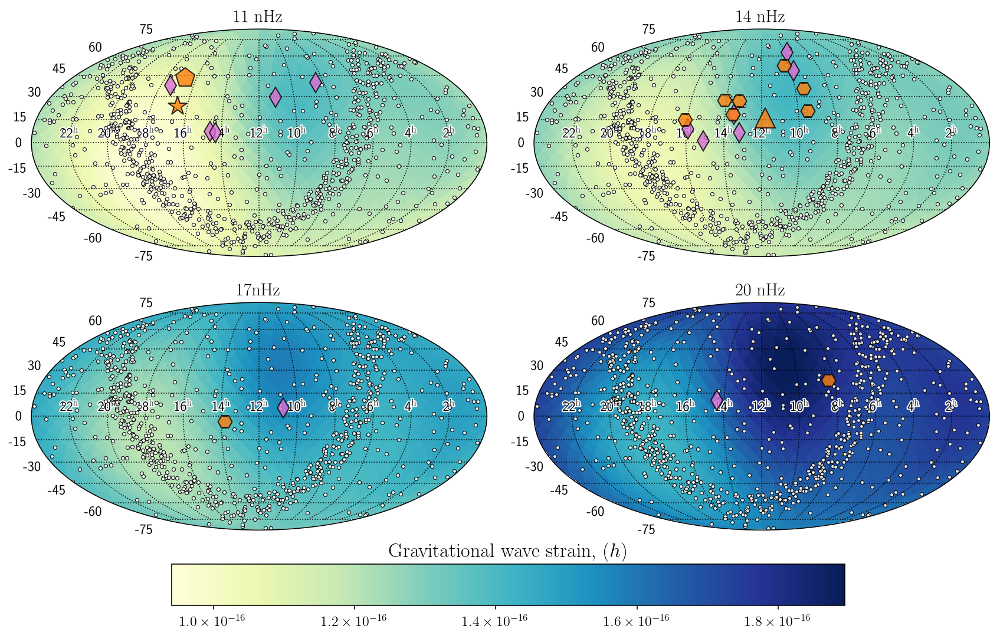

In [244]:
snr = 3
snr /= 2 #Correct for different definition of h0 in hasasia
fig = plt.figure(figsize=[12,8])
orient = 'horizontal'#'vertical'#
shrink = 0.7
cand_color='C1'#'orchid'
marker_alpha = 0.8
plt.rcParams['font.size'] = 12
plt.rcParams['text.usetex'] = True
def fmt(x, pos):
    a, b = '{:.1e}'.format(x).split('e')
    b = int(b)
    return r'${} \times 10^{{{}}}$'.format(a, b)


ax = plt.subplot(221, projection='astro mollweide')

ax.grid()
plot.outline_text(ax)

mp0 = plot.healpix_heatmap(snr*np.sqrt(SM_ska1_opt.S_eff[fidx0,:]/SM_ska1_opt.Tspan),
                           cmap=cmap, vmin=Min, vmax=Max)

cand1_sky = mpl_mwp_coords(cand1.ra.to('rad').value,np.pi/2-cand1.dec.to('rad').value)
cand2_sky = mpl_mwp_coords(cand2.ra.to('rad').value,np.pi/2-cand2.dec.to('rad').value)
cand3_sky = mpl_mwp_coords(cand3.ra.to('rad').value,np.pi/2-cand3.dec.to('rad').value)
for ii in range(ska1_sky[0].size):
    ax.plot(ska1_sky[0][ii],ska1_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=3, mew=0.6, mec='black', alpha=0.9)
for can in sets[11]:
    sky_pos = mpl_mwp_coords(can.sky.ra.to('rad').value,
                             np.pi/2-can.sky.dec.to('rad').value)
    if can.mc=='C1' and can.ms in ['*','p','^']:
#         zorder = 3
        ms = 17
    else:
#         zorder = 2
        ms = 12
    ax.plot(sky_pos[0][0],sky_pos[1],
                marker=can.ms, linestyle='none', color=can.mc,
                markersize=ms, mew=1, mec='black', alpha=marker_alpha)


plt.title(r'\rm{11 nHz}',fontsize=15)
plt.grid(linestyle='dotted', color='black')
# cb0_ticks=[2.5e-15,5e-15,7.5e-15,1e-14]
# fig.colorbar(mp0, orientation=orient, shrink=shrink, pad=0.10,#ticks=cb0_ticks, 
#              format=ticker.FuncFormatter(fmt))

ax1 = plt.subplot(222, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax1.grid()
plot.outline_text(ax1)
# ax1.set_facecolor(m.to_rgba(np.log10(total_power_ng9yr['marg_power'][-1])))

mp1 = plot.healpix_heatmap(snr*np.sqrt(SM_ska1_opt.S_eff[fidx1,:]/SM_ska1_opt.Tspan),
                           cmap=cmap, vmin=Min, vmax=Max)

ipta_sky = mpl_mwp_coords(SM_ipta_plus.phis,SM_ipta_plus.thetas)
for ii in range(ska1_sky[0].size):
    ax1.plot(ska1_sky[0][ii],ska1_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=3, mew=0.6, mec='black', alpha=0.9)
for can in sets[14]:
    sky_pos = mpl_mwp_coords(can.sky.ra.to('rad').value,
                             np.pi/2-can.sky.dec.to('rad').value)
    if can.mc=='C1' and can.ms in ['*','p','^']:
        zorder = 3
        ms = 17
    elif can.mc=='C1':
        zorder = 3
        ms = 12
    else:
        zorder = 2
        ms = 12
    ax1.plot(sky_pos[0][0],sky_pos[1],zorder=zorder,
                marker=can.ms, linestyle='none', color=can.mc,
                markersize=ms, mew=1, mec='black', alpha=marker_alpha)
    
plt.title(r'\rm{14 nHz}',fontsize=15)
plt.grid(linestyle='dotted', color='k')
# cb1_ticks=[4e-16,5e-16,6e-16]
# fig.colorbar(mp1, orientation=orient, shrink=shrink, pad=0.10,#ticks=cb1_ticks, 
#              format=ticker.FuncFormatter(fmt))

ax2 = plt.subplot(223, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax2.grid()
plot.outline_text(ax2)

mp2 = plot.healpix_heatmap(snr*np.sqrt(SM_ska1_opt.S_eff[fidx2,:]/SM_ska1_opt.Tspan),
                           cmap=cmap, vmin=Min, vmax=Max)
ska1_sky = mpl_mwp_coords(SM_ska1_opt.phis,SM_ska1_opt.thetas)
for ii in range(ska1_sky[0].size):
    ax2.plot(ska1_sky[0][ii],ska1_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=3, mew=0.6, mec='black', alpha=0.9)
for can in sets[17]:
    sky_pos = mpl_mwp_coords(can.sky.ra.to('rad').value,
                             np.pi/2-can.sky.dec.to('rad').value)
    if can.mc=='C1' and can.ms in ['*','p','^']:
        zorder = 3
        ms = 17
    else:
        zorder = 2
        ms = 12
    ax2.plot(sky_pos[0][0],sky_pos[1],
                marker=can.ms, linestyle='none', color=can.mc,
                markersize=ms, mew=1, mec='black', alpha=marker_alpha)

plt.title(r'\rm{17nHz}',fontsize=15)
plt.grid(linestyle='dotted', color='k')
# fig.colorbar(mp2, orientation=orient, shrink=shrink, pad=0.10, format=ticker.FuncFormatter(fmt))

ax3 = plt.subplot(224, projection='astro mollweide')

ax3.grid()
plot.outline_text(ax3)


mp3 = plot.healpix_heatmap(snr*np.sqrt(SM_ska1_opt.S_eff[fidx3,:]/SM_ska1_opt.Tspan),
                           cmap=cmap, vmin=Min, vmax=Max)
ska2_sky = mpl_mwp_coords(SM_ska2_opt.phis,SM_ska2_opt.thetas)
for ii in range(ska1_sky[0].size):
    ax3.plot(ska1_sky[0][ii],ska1_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=3, mew=0.6, mec='black', alpha=0.9)
for can in sets[20]:
    sky_pos = mpl_mwp_coords(can.sky.ra.to('rad').value,
                             np.pi/2-can.sky.dec.to('rad').value)
    if can.mc=='C1' and can.ms in ['*','p','^']:
        zorder = 3
        ms = 17
    else:
        zorder = 2
        ms = 12
    ax3.plot(sky_pos[0][0],sky_pos[1],
                marker=can.ms, linestyle='none', color=can.mc, zorder=zorder,
                markersize=ms, mew=1, mec='black', alpha=marker_alpha) 

plt.title(r'\rm{20 nHz}',fontsize=15)
plt.grid(linestyle='dotted', color='k')


# ax3 = plt.subplot(224)
# plt.title('$\log_{10}$(RN Power)',y=0.65,fontsize=14)
# ax3.axis('off')

plt.grid(linestyle='dotted', color='k')
#ax.set_title(r'NANOGrav 9-year Continuous Wave Limits at 8 nHz')
#fig.subplots_adjust(bottom=0.8)
# cbar_ax = fig.add_axes([0.33, 0.48, 0.33, 0.05])
# cbar_lines = [np.log10(total_power_ng5yr['marg_power'][-1]),
#               np.log10(total_power_ng9yr['marg_power'][-1]),
#               np.log10(total_power_ng11yr['marg_power'][-1])]
# cbar_ax.set_title('S/N',fontsize=15)
# cb3_ticks=[8.8e-17,9.4e-17,1e-16]
# fig.colorbar(mappable, cax=cbar_ax, orientation='horizontal',ticks=cbar_ticks)
# cb3=fig.colorbar(mp3, orientation=orient, shrink=shrink, #ticks=cb3_ticks,
#                  pad=0.10, format=ticker.FuncFormatter(fmt))#,ticks=cbar_ticks)


cbar_ax = fig.add_axes([0.18, 0.09, 0.66, 0.06])
cbar_ax.set_title(r'\rm{Gravitational wave strain,} ($h$)',fontsize=17)
fig.colorbar(mappable,  orientation='horizontal',cax=cbar_ax,
             format=ticker.FuncFormatter(fmt))#ticks=cbar_ticks)

# fig.suptitle('Gravitational Wave Strain', y=1.02, fontsize=17)

# fig.legend(handles=[p1[0],p2[0],p3[0]], loc=[0.39,0.42],fontsize=11)

plt.tight_layout(pad=1.01)
plt.subplots_adjust(bottom=0.16)#hspace=0.05)
plt.savefig('./strain_sky_maps_4freqs.pdf',bbox_inches='tight',dpi=150)
plt.show()

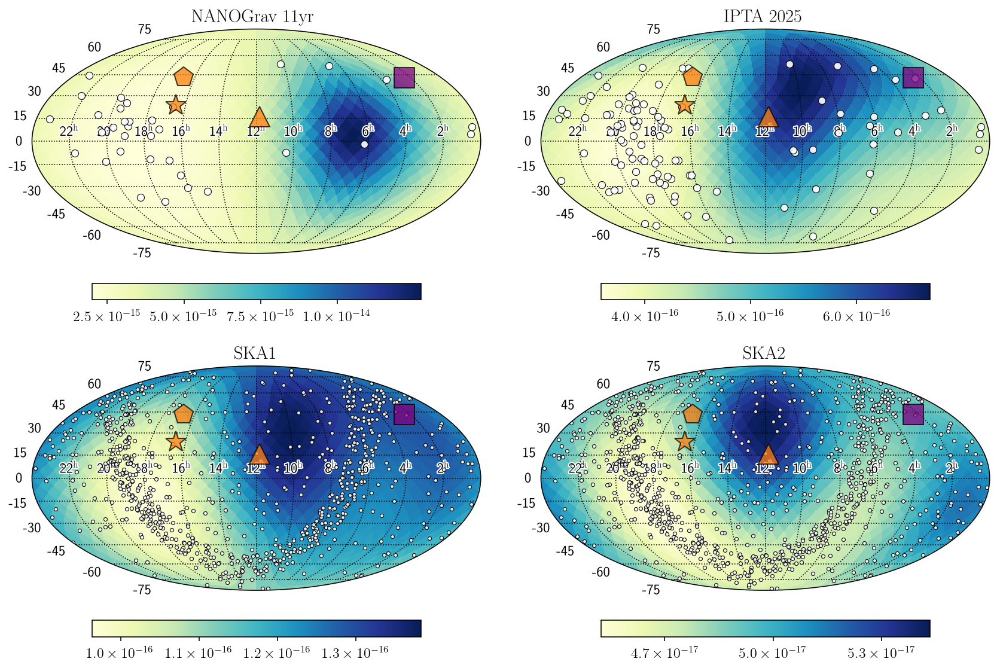

In [272]:
cmap = 'YlGnBu'#'viridis_r'#'cividis_r'#'YlGnBu'#'RdYlBu'#'PRGn'#'viridis'#'cubehelix'
snr = 3
snr /= 2
fig = plt.figure(figsize=[12,8])
orient = 'horizontal'#'vertical'#
shrink = 0.7
cand_color='C1'#'orchid'
marker_alpha = 0.75
fidx = np.argmin(np.abs(SM_ng11.freqs-1.18e-8))
plt.rcParams['font.size'] = 12
def fmt(x, pos):
    a, b = '{:.1e}'.format(x).split('e')
    b = int(b)
    return r'${} \times 10^{{{}}}$'.format(a, b)


ax = plt.subplot(221, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax.grid()
plot.outline_text(ax)
mp0 = plot.healpix_heatmap(snr*np.sqrt(SM_ng11.S_eff[fidx,:]/SM_ng11.Tspan),
                           cmap=cmap)#, vmin=1e-16)#, vmax=Max)

ng11_sky = mpl_mwp_coords(SM_ng11.phis,SM_ng11.thetas)
cand1_sky = mpl_mwp_coords(bh[0].sky.ra.to('rad').value,np.pi/2-bh[0].sky.dec.to('rad').value)
cand2_sky = mpl_mwp_coords(bh[1].sky.ra.to('rad').value,np.pi/2-bh[1].sky.dec.to('rad').value)
cand3_sky = mpl_mwp_coords(bh[2].sky.ra.to('rad').value,np.pi/2-bh[2].sky.dec.to('rad').value)
cand4_sky = mpl_mwp_coords(others[0].sky.ra.to('rad').value,np.pi/2-others[0].sky.dec.to('rad').value)

for ii in range(ng11_sky[0].size):
    ax.plot(ng11_sky[0][ii],ng11_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=6, mew=0.6, mec='black', alpha=0.9)
    
ax.plot(cand1_sky[0][0],cand1_sky[1],
            marker=bh[0].ms, linestyle='none', color=bh[0].mc,
            markersize=18, mew=1, mec='black', alpha=marker_alpha)
ax.plot(cand2_sky[0][0],cand2_sky[1],
            marker=bh[1].ms, linestyle='none', color=bh[1].mc,
            markersize=17,mew=1, mec='black', alpha=marker_alpha)
ax.plot(cand3_sky[0][0],cand3_sky[1],
            marker=bh[2].ms, linestyle='none', color=bh[2].mc,
            markersize=17, mew=1, mec='black', alpha=marker_alpha)
ax.plot(cand4_sky[0][0],cand4_sky[1],
            marker='s', linestyle='none', color='purple',
            markersize=17, mew=1, mec='black', alpha=marker_alpha)

plt.title(r'\rm{NANOGrav 11yr}',fontsize=15)
plt.grid(linestyle='dotted', color='black')
cb0_ticks=[2.5e-15,5e-15,7.5e-15,1e-14]
fig.colorbar(mp0, orientation=orient, shrink=shrink, pad=0.10,ticks=cb0_ticks, 
             format=ticker.FuncFormatter(fmt))

ax1 = plt.subplot(222, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax1.grid()
plot.outline_text(ax1)
# ax1.set_facecolor(m.to_rgba(np.log10(total_power_ng9yr['marg_power'][-1])))
mp1 = plot.healpix_heatmap(snr*np.sqrt(SM_ipta_plus.S_eff[fidx,:]/SM_ipta_plus.Tspan),
                           cmap=cmap)#, vmin=1e-16,
#                            vmax=(snr*np.sqrt(SM_ipta_plus.S_eff[fidx,:]/SM_ipta_plus.Tspan).max()))
ipta_sky = mpl_mwp_coords(SM_ipta_plus.phis,SM_ipta_plus.thetas)
for ii in range(ipta_sky[0].size):
    ax1.plot(ipta_sky[0][ii],ipta_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=6, mew=0.6, mec='black', alpha=0.9)
ax1.plot(cand1_sky[0][0],cand1_sky[1],
            marker=bh[0].ms, linestyle='none', color=bh[0].mc,
            markersize=18, mew=1, mec='black', alpha=marker_alpha)
ax1.plot(cand2_sky[0][0],cand2_sky[1],
            marker=bh[1].ms, linestyle='none', color=bh[1].mc,
            markersize=17, mew=1, mec='black', alpha=marker_alpha)
ax1.plot(cand3_sky[0][0],cand3_sky[1],
            marker=bh[2].ms, linestyle='none', color=bh[2].mc,
            markersize=17, mew=1, mec='black', alpha=marker_alpha)
ax1.plot(cand4_sky[0][0],cand4_sky[1],
            marker='s', linestyle='none', color='purple',
            markersize=17, mew=1, mec='black', alpha=marker_alpha)
    
plt.title(r'\rm{IPTA 2025}',fontsize=15)
plt.grid(linestyle='dotted', color='k')
cb1_ticks=[4e-16,5e-16,6e-16]
fig.colorbar(mp1, orientation=orient, shrink=shrink, pad=0.10,ticks=cb1_ticks, 
             format=ticker.FuncFormatter(fmt))

ax2 = plt.subplot(223, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax2.grid()
plot.outline_text(ax2)
mp2 = plot.healpix_heatmap(snr*np.sqrt(SM_ska1_opt.S_eff[fidx,:]/SM_ska1_opt.Tspan), 
                           cmap=cmap)#, vmin=Min, vmax=Max)
ska1_sky = mpl_mwp_coords(SM_ska1_opt.phis,SM_ska1_opt.thetas)
for ii in range(ska1_sky[0].size):
    ax2.plot(ska1_sky[0][ii],ska1_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=3, mew=0.6, mec='black', alpha=0.9)
ax2.plot(cand1_sky[0][0],cand1_sky[1],
            marker=bh[0].ms, linestyle='none', color=bh[0].mc,
            markersize=18, mew=1, mec='black', alpha=marker_alpha)
ax2.plot(cand2_sky[0][0],cand2_sky[1],
            marker=bh[1].ms, linestyle='none', color=bh[1].mc,
            markersize=17, mew=1, mec='black', alpha=marker_alpha)
ax2.plot(cand3_sky[0][0],cand3_sky[1],
            marker=bh[2].ms, linestyle='none', color=bh[2].mc,
            markersize=17, mew=1, mec='black', alpha=marker_alpha)
ax2.plot(cand4_sky[0][0],cand4_sky[1],
            marker='s', linestyle='none', color='purple',
            markersize=17, mew=1, mec='black', alpha=marker_alpha)

plt.title(r'\rm{SKA1}',fontsize=15)
plt.grid(linestyle='dotted', color='k')
fig.colorbar(mp2, orientation=orient, shrink=shrink, pad=0.10, format=ticker.FuncFormatter(fmt))

ax3 = plt.subplot(224, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax3.grid()
plot.outline_text(ax3)
# ax2.set_facecolor(m.to_rgba(np.log10(total_power_ng11yr['marg_power'][-1])))
mp3 = plot.healpix_heatmap(snr*np.sqrt(SM_ska2_opt.S_eff[fidx,:]/SM_ska2_opt.Tspan), cmap=cmap)#, vmin=Min, vmax=Max)
ska2_sky = mpl_mwp_coords(SM_ska2_opt.phis,SM_ska2_opt.thetas)
for ii in range(ska2_sky[0].size):
    ax3.plot(ska2_sky[0][ii],ska2_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=3, mew=0.6, mec='black', alpha=0.9)
p1=ax3.plot(cand1_sky[0][0],cand1_sky[1],
            marker=bh[0].ms, linestyle='none', color=bh[0].mc,
            markersize=18, mew=1, mec='black', alpha=marker_alpha,
            label=bh[0].name)
p2=ax3.plot(cand2_sky[0][0],cand2_sky[1],
            marker=bh[1].ms, linestyle='none', color=bh[1].mc,
            markersize=17, mew=1, mec='black', alpha=marker_alpha)
p3=ax3.plot(cand3_sky[0][0],cand3_sky[1],
            marker=bh[2].ms, linestyle='none', color=bh[2].mc,
            markersize=17, mew=1, mec='black', alpha=marker_alpha)
ax3.plot(cand4_sky[0][0],cand4_sky[1],
            marker='s', linestyle='none', color='purple',
            markersize=17, mew=1, mec='black', alpha=marker_alpha)

plt.title(r'\rm{SKA2}',fontsize=15)
plt.grid(linestyle='dotted', color='k')


# ax3 = plt.subplot(224)
# plt.title('$\log_{10}$(RN Power)',y=0.65,fontsize=14)
# ax3.axis('off')

plt.grid(linestyle='dotted', color='k')
#ax.set_title(r'NANOGrav 9-year Continuous Wave Limits at 8 nHz')
#fig.subplots_adjust(bottom=0.8)
# cbar_ax = fig.add_axes([0.33, 0.48, 0.33, 0.05])
# cbar_lines = [np.log10(total_power_ng5yr['marg_power'][-1]),
#               np.log10(total_power_ng9yr['marg_power'][-1]),
#               np.log10(total_power_ng11yr['marg_power'][-1])]
# cbar_ax.set_title('S/N',fontsize=15)
cb3_ticks=[4.7e-17,5.0e-17,5.3e-17]
# fig.colorbar(mappable, cax=cbar_ax, orientation='horizontal',ticks=cbar_ticks)
cb3=fig.colorbar(mp3, orientation=orient, shrink=shrink, ticks=cb3_ticks,
                 pad=0.10, format=ticker.FuncFormatter(fmt))#,ticks=cbar_ticks)
# cb3.formatter.set_powerlimits((0, 0))
# cb3.ax.yaxis.set_offset_position('right')
# cb3.update_ticks()
ax.yaxis.offsetText
# cbar_ax.axvline(cbar_lines[0],color='white',linestyle='--',linewidth=0.7)#, 'w',linestyle='--')
# cbar_ax.axvline(cbar_lines[1],color='white',linestyle='--',linewidth=0.7)
# cbar_ax.axvline(cbar_lines[2],color='white',linestyle='--',linewidth=0.7)
#cb.ax.plot(cbar_lines[0], 'w',linestyle='--')
#cb.ax.plot(cbar_lines[1], 'w',linestyle='--')
#cb.ax.plot(cbar_lines[2], 'w',linestyle='--')
# fig.suptitle(r'\rm{Gravitational Wave Strain, 11 nHz}', y=1.02, fontsize=17)

# fig.legend(handles=[p1[0],p2[0],p3[0]], loc=[0.39,0.42],
#            fontsize=12, frameon=False, framealpha=0.1)
plt.tight_layout(pad=1.05)
plt.savefig('./strain_sky_maps_11p8nHz_w3C66B.pdf',bbox_inches='tight',dpi=150)
plt.show()

In [253]:
bh[0].name,bh[1].name,bh[2].name 

('HS_1630+2355', 'SDSS_J164452.71+4307', 'SDSS_J114857.33+1600')

In [200]:
snr = 3
snr /= 2 #Correct for differnt definition of h0 in hasasia
fidx0 = np.argmin(np.abs(freqs-11e-9))
fidx1 = np.argmin(np.abs(freqs-53.4e-9))

Min = (snr*np.sqrt(SM_ska1_opt.S_eff[fidx0,:]/SM_ska1_opt.Tspan)).min()
Max = (snr*np.sqrt(SM_ska1_opt.S_eff[fidx1,:]/SM_ska1_opt.Tspan)).max()
# norm = mpl.colors.Normalize(vmin=Min, vmax=Max)
# cmap = cm.viridis#Reds
# x = 9

# m = cm.ScalarMappable(norm=norm, cmap=cmap)
# # print(m.to_rgba(x))
# cmap = discrete_cmap(26,'RdYlBu')#'cubehelix'
cmap = 'YlGnBu'#'viridis'#'RdYlBu'#'PRGn'#'viridis'#'cubehelix'
skymap = np.linspace(Min, Max, SM_ska1_opt.S_eff[fidx3,:].size)
mappable = plot.healpix_heatmap(skymap, cmap=cmap, vmin=Min, vmax=Max)
plt.close()

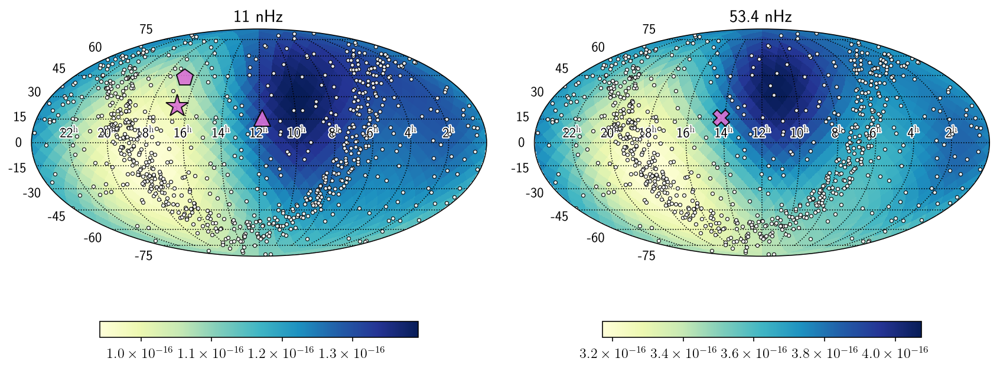

In [201]:
snr = 3
snr /= 2 #Correct for differnt definition of h0 in hasasia
fig = plt.figure(figsize=[12,8])
orient = 'horizontal'#'vertical'#
shrink = 0.7
cand_color='orchid'
plt.rcParams['font.size'] = 12
def fmt(x, pos):
    a, b = '{:.1e}'.format(x).split('e')
    b = int(b)
    return r'${} \times 10^{{{}}}$'.format(a, b)


ax = plt.subplot(121, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax.grid()
plot.outline_text(ax)
fidx0 = np.argmin(np.abs(freqs-11e-9))
mp0 = plot.healpix_heatmap(snr*np.sqrt(SM_ska1_opt.S_eff[fidx0,:]/SM_ska1_opt.Tspan),
                           cmap=cmap)#, vmin=Min, vmax=Max)

cand0_sky = mpl_mwp_coords(cand0.ra.to('rad').value,np.pi/2-cand1.dec.to('rad').value)
cand1_sky = mpl_mwp_coords(cand1.ra.to('rad').value,np.pi/2-cand1.dec.to('rad').value)
cand2_sky = mpl_mwp_coords(cand2.ra.to('rad').value,np.pi/2-cand2.dec.to('rad').value)
cand3_sky = mpl_mwp_coords(cand3.ra.to('rad').value,np.pi/2-cand3.dec.to('rad').value)
for ii in range(ska1_sky[0].size):
    ax.plot(ska1_sky[0][ii],ska1_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=3, mew=0.6, mec='black', alpha=0.9)
    
ax.plot(cand1_sky[0][0],cand1_sky[1],
            marker='p', linestyle='none', color=cand_color,
            markersize=15, mew=1, mec='black', alpha=0.9)
ax.plot(cand2_sky[0][0],cand2_sky[1],
            marker='^', linestyle='none', color=cand_color,
            markersize=14, mew=1, mec='black', alpha=0.9)
ax.plot(cand3_sky[0][0],cand3_sky[1],
            marker='*', linestyle='none', color=cand_color,
            markersize=20, mew=1, mec='black', alpha=0.9)

plt.title('11 nHz',fontsize=15)
plt.grid(linestyle='dotted', color='black')
cb0_ticks=[2.5e-15,5e-15,7.5e-15,1e-14]
fig.colorbar(mp0, orientation=orient, shrink=shrink, pad=0.10,#ticks=cb0_ticks, 
             format=ticker.FuncFormatter(fmt))

ax1 = plt.subplot(122, projection='astro mollweide')
# plt.rcParams['text.usetex'] = True
ax1.grid()
plot.outline_text(ax1)
# ax1.set_facecolor(m.to_rgba(np.log10(total_power_ng9yr['marg_power'][-1])))
fidx1 = np.argmin(np.abs(freqs-53.4e-9))
mp1 = plot.healpix_heatmap(snr*np.sqrt(SM_ska1_opt.S_eff[fidx1,:]/SM_ska1_opt.Tspan),
                           cmap=cmap)#, vmin=Min, vmax=Max)


for ii in range(ska1_sky[0].size):
    ax1.plot(ska1_sky[0][ii],ska1_sky[1][ii],
            marker='o', linestyle='none', color='white',
            markersize=3, mew=0.6, mec='black', alpha=0.9)

ax1.plot(cand0_sky[0][0],cand2_sky[1],
            marker='X', linestyle='none', color=cand_color,
            markersize=14, mew=1, mec='black', alpha=0.9)
    
plt.title('53.4 nHz',fontsize=15)
plt.grid(linestyle='dotted', color='k')
cb1_ticks=[4e-16,5e-16,6e-16]
fig.colorbar(mp1, orientation=orient, shrink=shrink, pad=0.10,#ticks=cb1_ticks, 
             format=ticker.FuncFormatter(fmt))


# fig.suptitle('Gravitational Wave Strain',  fontsize=17)

# fig.legend(handles=[p1[0],p2[0],p3[0]], loc=[0.39,0.42],fontsize=11)

plt.tight_layout(pad=1.05)

plt.savefig('./strain_sky_maps_11nHz.pdf',bbox_inches='tight',dpi=150)
plt.show()

In [ ]:
import os

In [ ]:
(1/(11.3e-9*u.Hz)).to('yr')

In [ ]:
1/(0.7634/1000)

In [ ]:
1/(0.2733/1000)

In [ ]:
5/(12.4*365.25*24*3600)

In [ ]:
3.95e-16/(4*np.pi*1.13e-8)

In [ ]:
1/(1-np.cos(theta))

In [ ]:
3.95e-16/(4*np.pi*1.13e-8)/(1-np.cos(theta))

In [ ]:
fb = 1/(175.5*24*3600)*u.Hz
fb

In [ ]:
fpx = 2/(365.25*24*3600)*u.Hz
fpx

In [ ]:
fbh = 1.13e-8*u.Hz

In [ ]:
np.abs(fpx-fb)*np.arange(1,6)

In [ ]:
fyr = 1/(365.25*24*3600)*u.Hz
fyr

In [ ]:
149/400